In [301]:
from pathlib import Path
import pandas as pd
import autosklearn.regression
import sklearn
import matplotlib.pyplot as plt
import joblib
import math
import time
from IPython.display import display
from nextorch import plotting, bo, doe, io

from pprint import pprint

import sklearn.datasets
import sklearn.metrics

import autosklearn.classification
from tqdm import trange

In [303]:
# Train the flow reaction model for yield prediction from scratch
DATA_PATH = Path("../data/yield")
TRAIN = DATA_PATH / "train.csv"
TEST = DATA_PATH / "test.csv"
dataset_name = "flow"


def load_data(path: Path) -> tuple:
    df = pd.read_csv(path)
    X = df.drop("target", axis=1).to_numpy()
    y = df["target"].to_numpy()
    return df, X, y


df_train, X_train, y_train = load_data(TRAIN)
df_test, X_test, y_test = load_data(TEST)

In [304]:
# Inspect the input data
df = pd.concat([df_train, df_test])
print(len(df))
df.head()

29


,m_B,t_RT1,T_drawH,m_C,t_RT2,T_methyl,target
0,2.66,8.45,-39.0,3.15,121.20,-30,54.65
1,2.65,4.23,-39.0,3.15,121.20,-30,74.50
2,2.66,2.07,-39.0,3.15,121.20,-30,72.93
3,3.13,3.70,-39.0,3.15,121.20,-30,71.73
4,2.07,9.14,-34.0,0.71,8.64,-35,24.49


In [305]:
# Set the operating range for each parameter
X_ranges = []
# Set the reponse range
Y_plot_range = []

for column in df.columns:
    num = len(df)
    max_value = df[column].max()
    min_value = df[column].min()
    data_range = max_value - min_value
    print(f"ColName: {column}")
    print(f"Max value: {max_value}, Recommendation: {math.ceil(max_value)}")
    print(f"Min value: {min_value}, Recommendation: {math.floor(min_value)}")
    print(f"Range: {data_range}, Recommendation: {data_range / num}")
    print("------------------------")
    # Excludes traget
    if column == "target":
        Y_plot_range.extend([0, 100])
    else:
        X_ranges.append([min_value, max_value])

ColName: m_B
Max value: 3.13, Recommendation: 4
Min value: 2.07, Recommendation: 2
Range: 1.06, Recommendation: 0.036551724137931035
------------------------
ColName: t_RT1
Max value: 36.57, Recommendation: 37
Min value: 2.07, Recommendation: 2
Range: 34.5, Recommendation: 1.1896551724137931
------------------------
ColName: T_drawH
Max value: -17.3, Recommendation: -17
Min value: -49.0, Recommendation: -49
Range: 31.7, Recommendation: 1.0931034482758621
------------------------
ColName: m_C
Max value: 3.15, Recommendation: 4
Min value: 0.71, Recommendation: 0
Range: 2.44, Recommendation: 0.08413793103448276
------------------------
ColName: t_RT2
Max value: 278.6, Recommendation: 279
Min value: 3.85, Recommendation: 3
Range: 274.75, Recommendation: 9.474137931034482
------------------------
ColName: T_methyl
Max value: -12, Recommendation: -12
Min value: -41, Recommendation: -41
Range: 29, Recommendation: 1.0
------------------------
ColName: target
Max value: 83.42, Recommendation: 8

In [306]:
# Auto-sklearn model
model_path = Path("../model/autosklearn/")
model_path.mkdir(exist_ok=True, parents=True)

rerun = False

if rerun:
    automl = autosklearn.regression.AutoSklearnRegressor(
        time_left_for_this_task=120,
        per_run_time_limit=30,
    )
    automl.fit(X_train, y_train, dataset_name=dataset_name)
    joblib.dump(automl, model_path / "auto-sklearn_reg_single.pkl")
else:
    automl = joblib.load(model_path / "auto-sklearn_reg_single.pkl")
    print(automl.predict(X_train))  # Print some prediction for X_train

Fitting to the training data:   0%|          | 0/120 [00:00<?, ?it/s, The total time budget for this task is 0:02:00]

Fitting to the training data: 100%|██████████| 120/120 [01:49<00:00,  1.10it/s, The total time budget for this task is 0:02:00]


          rank  ensemble_weight              type      cost  duration
model_id                                                             
2            1             0.02     random_forest  0.227954  1.168553
14           2             0.22  gaussian_process  0.243685  0.727832
59           3             0.34  gaussian_process  0.254695  0.595869
11           4             0.42    ard_regression  0.318362  0.706851
Train R2 score: 0.9150802377768691
Test R2 score: 0.8597980294765499


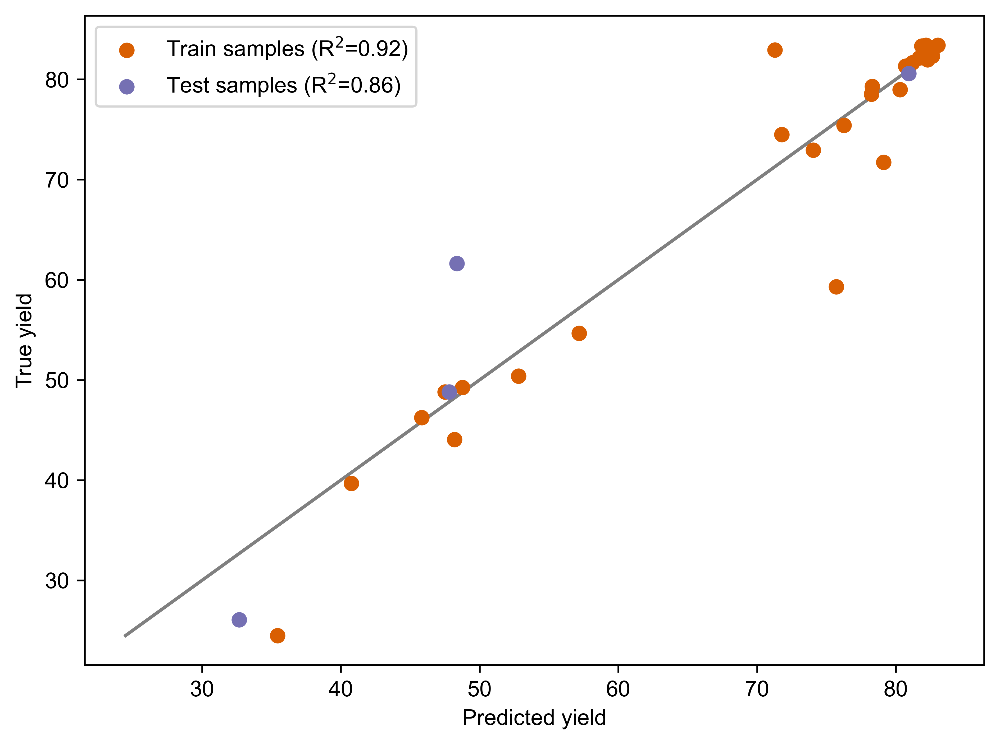

In [307]:
# Assuming `automl` has been properly defined and fitted, and X_train, y_train, X_test, y_test are defined
print(automl.leaderboard())

# Get the R2 score of the final ensemble for both train and test sets
train_predictions = automl.predict(X_train)
train_r2 = sklearn.metrics.r2_score(y_train, train_predictions)
print("Train R2 score:", train_r2)

test_predictions = automl.predict(X_test)
test_r2 = sklearn.metrics.r2_score(y_test, test_predictions)
print("Test R2 score:", test_r2)

# Plotting
plt.rcParams["font.family"] = "arial"
plt.rcParams['figure.dpi'] = 600

plt.scatter(train_predictions, y_train, label=f"Train samples (R$^2$={train_r2:.2f})", c="#d95f02")
plt.scatter(test_predictions, y_test, label=f"Test samples (R$^2$={test_r2:.2f})", c="#7570b3")
plt.xlabel("Predicted yield")
plt.ylabel("True yield")
plt.legend()

# Add a diagonal line to represent the perfect R2 score
plt.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         c="grey", zorder=0)

plt.tight_layout()
plt.show()

In [308]:
def Reactor(X_real):
    Y_real = automl.predict(X_real)
    return Y_real.reshape(-1, 1)  # yield

In [309]:
# Objective function
objective_func = Reactor

# Define the design space
x_name_simple = df.columns[:-1]
X_name_list = x_name_simple
X_units = ["" for i in range(len(x_name_simple))]

# Add the units
X_name_with_unit = []
for i, var in enumerate(X_name_list):
    if not X_units[i] == "":
        var = var + " (" + X_units[i] + ")"
    X_name_with_unit.append(var)

# One output
Y_name_with_unit = "Yield"

# combine X and Y names
var_names = X_name_with_unit + [Y_name_with_unit]

# Get the information of the design space
n_dim = len(X_name_list)  # the dimension of inputs
n_objective = 1  # the dimension of outputs

In [310]:
# Initial Sampling
# Full factorial design
n_dim = 6
n_ff_level = 3
# n_total = n_ff_level**n_dim
n_total = n_ff_level**n_dim

X_ff = doe.full_factorial([n_ff_level for i in range(n_dim)])
# Get the initial responses
Y_ff = bo.eval_objective_func(X_ff, X_ranges, objective_func)

In [311]:
# Latin hypercube design with 10 initial points
n_init_lhc = 30
X_init_lhc = doe.latin_hypercube(n_dim=n_dim, n_points=n_init_lhc, seed=2)
# Get the initial responses
Y_init_lhc = bo.eval_objective_func(X_init_lhc, X_ranges, objective_func)

In [312]:
# Completely random design
X_rnd = doe.randomized_design(n_dim=n_dim, n_points=n_total, seed=1)
# Get the responses
Y_rnd = bo.eval_objective_func(X_rnd, X_ranges, objective_func)

In [313]:
# Slight modification on names
X_name_with_unit = ["Eq-B", "$t_{res}$-1", "Temp-1", "Eq-C", "$t_{res}$-2", "Temp-2"]

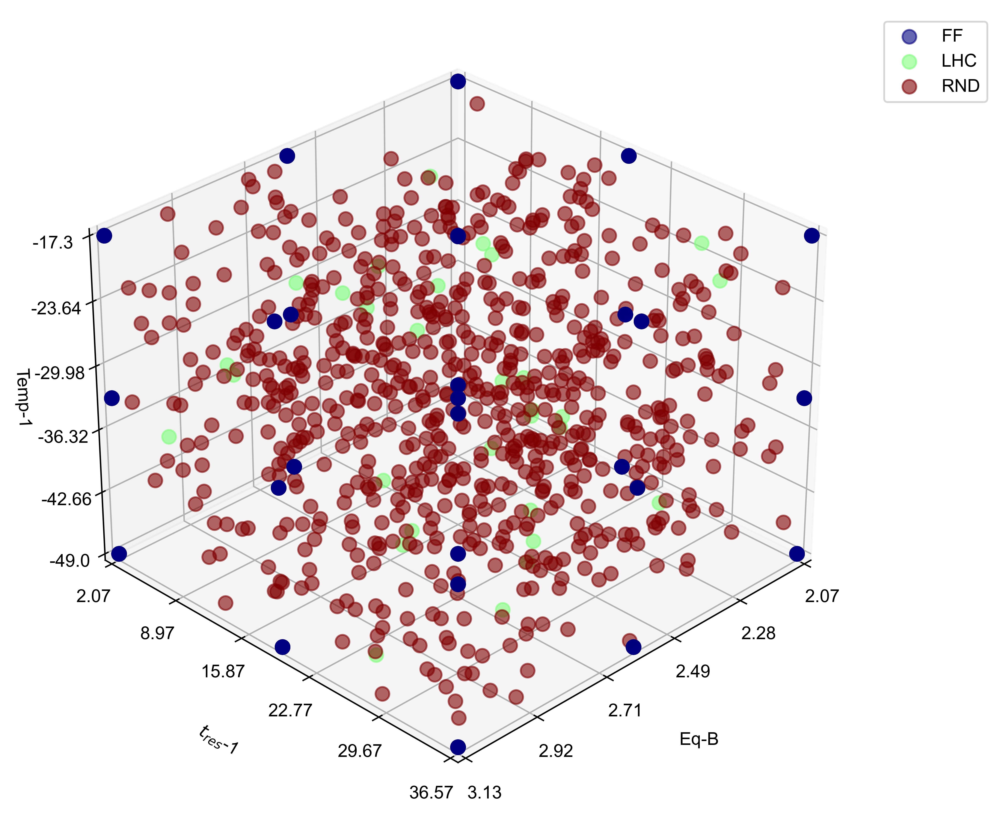

In [314]:
# Compare the 3 sampling plans

plotting.sampling_3d(
    [X_ff, X_init_lhc, X_rnd],
    X_names=X_name_with_unit,
    X_ranges=X_ranges,
    design_names=["FF", "LHC", "RND"],
)

In [315]:
# %% Initialize an Experiment object
# Set its name, the files will be saved under the folder with the same name
Exp_ff = bo.Experiment("yield_ff")
# Import the initial data
Exp_ff.input_data(X_ff, Y_ff, X_ranges=X_ranges, unit_flag=True)
# Set the optimization specifications
# here we set the objective function, minimization by default
Exp_ff.set_optim_specs(objective_func=objective_func, maximize=True)

Iter 10/100: 1.2825138568878174
Iter 20/100: 1.0879244804382324
Iter 30/100: 0.7180619239807129
Iter 40/100: -1.1767759323120117
Iter 50/100: -1.428078532218933
Iter 60/100: -1.57016921043396
Iter 70/100: -1.663377285003662
Iter 80/100: -1.7254948616027832
Iter 90/100: -1.7687087059020996
Iter 100/100: -1.8010399341583252


In [316]:
# Set its name, the files will be saved under the folder with the same name
Exp_lhc = bo.Experiment("yield_lhc")
# Import the initial data
Exp_lhc.input_data(X_init_lhc, Y_init_lhc, X_ranges=X_ranges, unit_flag=True)
# Set the optimization specifications
# here we set the objective function, minimization by default
Exp_lhc.set_optim_specs(objective_func=objective_func, maximize=True)

Iter 10/100: 1.685961365699768
Iter 20/100: 1.5871330499649048
Iter 30/100: 1.4917047023773193
Iter 40/100: 1.31609308719635


In [317]:
# Set its name, the files will be saved under the folder with the same name
Exp_rnd = bo.Experiment("yield_rnd")
# Import the initial data
Exp_rnd.input_data(X_rnd, Y_rnd, X_ranges=X_ranges, unit_flag=True)
# Set the optimization specifications
# here we set the objective function, minimization by default
Exp_rnd.set_optim_specs(objective_func=objective_func, maximize=True)

Iter 10/100: 1.2591890096664429
Iter 20/100: 1.074319839477539
Iter 30/100: 0.7235392928123474
Iter 40/100: 0.08496790379285812


In [318]:
# Optimization loop
# Set the number of iterations
n_trials_lhc = n_total - n_init_lhc
print(f"Num of trials of lhc: {n_trials_lhc}")
for i in trange(n_trials_lhc):
    # Generate the next experiment point
    X_new, X_new_real, acq_func = Exp_lhc.generate_next_point()
    # Get the reponse at this point
    Y_new_real = objective_func(X_new_real)
    # or
    # Y_new_real = bo.eval_objective_func(X_new, X_ranges, objective_func)

    # Retrain the model by input the next point into Exp object
    Exp_lhc.run_trial(X_new, X_new_real, Y_new_real)

Num of trials of lhc: 699


  0%|          | 1/699 [00:00<02:37,  4.43it/s]

Iter 10/100: 1.3108552694320679


  0%|          | 2/699 [00:00<03:47,  3.07it/s]

Iter 10/100: 1.3480173349380493


  0%|          | 3/699 [00:01<04:39,  2.49it/s]

Iter 10/100: 1.3308898210525513


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)
  1%|          | 4/699 [00:02<08:09,  1.42it/s]

Iter 10/100: 1.2983251810073853


  1%|          | 5/699 [00:02<07:51,  1.47it/s]

Iter 10/100: 1.2725675106048584


  1%|          | 6/699 [00:03<07:31,  1.54it/s]

Iter 10/100: 1.2416987419128418


  1%|          | 7/699 [00:04<07:37,  1.51it/s]

Iter 10/100: 1.234273910522461


  1%|          | 8/699 [00:04<06:34,  1.75it/s]

Iter 10/100: 1.207139015197754


  1%|▏         | 9/699 [00:05<06:32,  1.76it/s]

Iter 10/100: 1.174452543258667


  1%|▏         | 10/699 [00:05<06:17,  1.82it/s]

Iter 10/100: 1.1595395803451538


  2%|▏         | 11/699 [00:05<05:22,  2.14it/s]

Iter 10/100: 1.110815167427063


  2%|▏         | 12/699 [00:06<05:12,  2.20it/s]

Iter 10/100: 1.017441749572754
Iter 20/100: 0.9337040781974792


  2%|▏         | 13/699 [00:06<05:44,  1.99it/s]

Iter 10/100: 1.0296746492385864


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)
  2%|▏         | 14/699 [00:07<06:27,  1.77it/s]

Iter 10/100: 0.9898054599761963
Iter 20/100: 0.9076662659645081


  2%|▏         | 15/699 [00:08<06:26,  1.77it/s]

Iter 10/100: 1.0348937511444092


  2%|▏         | 16/699 [00:09<07:11,  1.58it/s]

Iter 10/100: 0.7225019931793213
Iter 20/100: 0.7216330766677856
Iter 30/100: 0.7209904789924622
Iter 40/100: 0.7207391858100891


  2%|▏         | 17/699 [00:09<06:16,  1.81it/s]

Iter 10/100: 0.7465855479240417
Iter 20/100: 0.700539231300354


  3%|▎         | 18/699 [00:09<05:03,  2.24it/s]

Iter 10/100: 0.6859663128852844


  3%|▎         | 19/699 [00:10<04:57,  2.29it/s]

Iter 10/100: 1.0391169786453247


  3%|▎         | 20/699 [00:10<05:19,  2.13it/s]

Iter 10/100: 0.7111995220184326


  3%|▎         | 21/699 [00:11<05:37,  2.01it/s]

Iter 10/100: 0.9917453527450562
Iter 10/100: 0.5025959014892578


  3%|▎         | 22/699 [00:11<04:38,  2.43it/s]

Iter 20/100: 0.5009793639183044


  3%|▎         | 23/699 [00:11<04:38,  2.42it/s]

Iter 10/100: 0.5042753219604492


  3%|▎         | 24/699 [00:11<04:07,  2.73it/s]

Iter 10/100: 0.49268639087677
Iter 20/100: 0.49260956048965454


  4%|▎         | 25/699 [00:12<04:41,  2.39it/s]

Iter 10/100: 0.48643073439598083


  4%|▎         | 26/699 [00:13<04:53,  2.29it/s]

Iter 10/100: 0.4820394217967987
Iter 20/100: 0.4816958010196686


  4%|▍         | 27/699 [00:13<04:44,  2.37it/s]

Iter 10/100: 0.4664950370788574
Iter 20/100: 0.4660916328430176


  4%|▍         | 28/699 [00:13<03:59,  2.80it/s]

Iter 10/100: 0.44435280561447144


  4%|▍         | 29/699 [00:13<03:37,  3.07it/s]

Iter 10/100: 0.44901296496391296
Iter 20/100: 0.44875186681747437


  4%|▍         | 30/699 [00:14<03:43,  3.00it/s]

Iter 10/100: 0.49105289578437805
Iter 20/100: 0.4905005097389221
Iter 30/100: 0.49042809009552


  4%|▍         | 31/699 [00:14<03:53,  2.86it/s]

Iter 10/100: 0.5019644498825073
Iter 20/100: 0.5016789436340332
Iter 30/100: 0.5015873312950134
Iter 10/100: 0.49108240008354187


  5%|▍         | 32/699 [00:14<03:15,  3.41it/s]

Iter 20/100: 0.4908546805381775


  5%|▍         | 33/699 [00:15<03:09,  3.51it/s]

Iter 10/100: 0.496360719203949
Iter 20/100: 0.4961467385292053


  5%|▍         | 34/699 [00:15<03:46,  2.94it/s]

Iter 10/100: 0.496204137802124
Iter 20/100: 0.4960832893848419


  5%|▌         | 35/699 [00:15<03:53,  2.85it/s]

Iter 10/100: 0.4995693564414978
Iter 20/100: 0.4994608461856842


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)
  5%|▌         | 36/699 [00:16<04:01,  2.75it/s]

Iter 10/100: 0.48989129066467285
Iter 20/100: 0.48946577310562134


  5%|▌         | 37/699 [00:16<03:49,  2.89it/s]

Iter 10/100: 0.7236895561218262


  5%|▌         | 38/699 [00:17<04:06,  2.68it/s]

Iter 10/100: 0.9221553802490234


  6%|▌         | 39/699 [00:17<04:54,  2.24it/s]

Iter 10/100: 0.8479366898536682


  6%|▌         | 40/699 [00:18<05:04,  2.17it/s]

Iter 10/100: 0.8685960173606873


  6%|▌         | 41/699 [00:18<04:12,  2.61it/s]

Iter 10/100: 0.8553704023361206


  6%|▌         | 42/699 [00:18<03:55,  2.79it/s]

Iter 10/100: 0.8398765921592712


  6%|▌         | 43/699 [00:19<05:58,  1.83it/s]

Iter 10/100: 0.8276443481445312


  6%|▋         | 45/699 [00:20<04:07,  2.64it/s]

Iter 10/100: 0.8154229521751404
Iter 10/100: 0.8019671440124512


  7%|▋         | 46/699 [00:20<05:07,  2.12it/s]

Iter 10/100: 0.7909618020057678


  7%|▋         | 47/699 [00:21<04:39,  2.34it/s]

Iter 10/100: 0.7812477946281433


  7%|▋         | 48/699 [00:21<04:44,  2.29it/s]

Iter 10/100: 0.7693936824798584


  7%|▋         | 49/699 [00:22<04:57,  2.18it/s]

Iter 10/100: 0.7588144540786743


  7%|▋         | 50/699 [00:22<05:03,  2.14it/s]

Iter 10/100: 0.7466694712638855


  7%|▋         | 51/699 [00:23<05:29,  1.96it/s]

Iter 10/100: 0.7414859533309937


  7%|▋         | 52/699 [00:23<06:15,  1.72it/s]

Iter 10/100: 0.7312780022621155


  8%|▊         | 53/699 [00:24<06:51,  1.57it/s]

Iter 10/100: 0.7198649048805237


  8%|▊         | 54/699 [00:25<07:02,  1.53it/s]

Iter 10/100: 0.7142337560653687


  8%|▊         | 55/699 [00:26<07:23,  1.45it/s]

Iter 10/100: 0.6958800554275513


  8%|▊         | 56/699 [00:26<06:33,  1.63it/s]

Iter 10/100: 0.6942349076271057


  8%|▊         | 57/699 [00:26<05:36,  1.91it/s]

Iter 10/100: 0.6816036105155945


  8%|▊         | 58/699 [00:27<06:03,  1.76it/s]

Iter 10/100: 0.6878147125244141


  8%|▊         | 59/699 [00:28<06:02,  1.77it/s]

Iter 10/100: 0.6788954734802246


  9%|▊         | 60/699 [00:28<05:25,  1.96it/s]

Iter 10/100: 0.6713030338287354


  9%|▊         | 61/699 [00:29<05:53,  1.81it/s]

Iter 10/100: 0.6631464958190918


  9%|▉         | 62/699 [00:29<06:40,  1.59it/s]

Iter 10/100: 0.6545419096946716


  9%|▉         | 63/699 [00:30<05:59,  1.77it/s]

Iter 10/100: 0.5890312790870667
Iter 10/100: -0.20310832560062408
Iter 20/100: -0.28618353605270386


  9%|▉         | 64/699 [00:30<05:19,  1.99it/s]

Iter 30/100: -0.28798729181289673
Iter 40/100: -0.29088589549064636
Iter 50/100: -0.2942991256713867
Iter 60/100: -0.2966558337211609
Iter 70/100: -0.2971576452255249


  9%|▉         | 65/699 [00:30<04:29,  2.35it/s]

Iter 10/100: -0.29212939739227295
Iter 20/100: -0.2921265959739685


  9%|▉         | 66/699 [00:31<04:00,  2.63it/s]

Iter 10/100: -0.28427746891975403


 10%|▉         | 67/699 [00:31<04:10,  2.53it/s]

Iter 10/100: -0.2762680947780609
Iter 20/100: -0.27666470408439636


 10%|▉         | 68/699 [00:31<03:48,  2.77it/s]

Iter 10/100: -0.268829345703125
Iter 20/100: -0.26918572187423706


 10%|▉         | 69/699 [00:32<03:31,  2.98it/s]

Iter 10/100: -0.26294443011283875
Iter 20/100: -0.26314201951026917


 10%|█         | 70/699 [00:32<04:12,  2.49it/s]

Iter 10/100: -0.25747939944267273


 10%|█         | 71/699 [00:33<04:11,  2.50it/s]

Iter 10/100: -0.25086185336112976
Iter 20/100: -0.25109851360321045


 10%|█         | 72/699 [00:33<03:43,  2.81it/s]

Iter 10/100: -0.2441132664680481


 10%|█         | 73/699 [00:33<03:27,  3.02it/s]

Iter 10/100: -0.23989324271678925
Iter 10/100: -0.2342344969511032
Iter 20/100: -0.23449937999248505


 11%|█         | 75/699 [00:34<03:09,  3.29it/s]

Iter 10/100: -0.22562961280345917


 11%|█         | 77/699 [00:34<03:01,  3.42it/s]

Iter 10/100: -0.20393626391887665
Iter 10/100: -0.18583758175373077
Iter 20/100: -0.18592697381973267


 11%|█         | 78/699 [00:35<02:57,  3.50it/s]

Iter 10/100: -0.18381713330745697
Iter 20/100: -0.1841326802968979


 11%|█▏        | 79/699 [00:35<03:10,  3.25it/s]

Iter 10/100: -0.17672862112522125
Iter 20/100: -0.17700940370559692


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)
/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:301: RuntimeWarning: Optimization failed on the second try, after generating a new set of initial conditions.
  RuntimeWarning,
 11%|█▏        | 80/699 [00:35<02:47,  3.70it/s]

Iter 10/100: -0.1720474809408188
Iter 10/100: -0.168556809425354
Iter 20/100: -0.16888420283794403


 12%|█▏        | 82/699 [00:36<02:18,  4.45it/s]

Iter 10/100: -0.14604854583740234
Iter 20/100: -0.14615924656391144
Iter 10/100: -0.11805468797683716


 12%|█▏        | 83/699 [00:36<02:13,  4.63it/s]

Iter 20/100: -0.11836818605661392
Iter 30/100: -0.11849208921194077


 12%|█▏        | 85/699 [00:36<02:16,  4.49it/s]

Iter 10/100: -0.11717502772808075
Iter 10/100: -0.11333338171243668
Iter 20/100: -0.11354444921016693


 12%|█▏        | 86/699 [00:36<02:19,  4.41it/s]

Iter 10/100: -0.1123214066028595
Iter 20/100: -0.11256935447454453


 12%|█▏        | 87/699 [00:37<02:15,  4.50it/s]

Iter 10/100: -0.11450809240341187
Iter 20/100: -0.1147928312420845
Iter 10/100: -0.11490322649478912


 13%|█▎        | 90/699 [00:37<01:37,  6.25it/s]

Iter 10/100: -0.10994716733694077
Iter 10/100: -0.09148883074522018
Iter 20/100: -0.0917026549577713


 13%|█▎        | 91/699 [00:37<01:38,  6.20it/s]

Iter 10/100: -0.08921854197978973
Iter 20/100: -0.08940249681472778
Iter 10/100: -0.08723537623882294
Iter 10/100: -0.08986643701791763


 13%|█▎        | 93/699 [00:37<01:19,  7.62it/s]

Iter 20/100: -0.09011072665452957
Iter 10/100: -0.08578917384147644
Iter 10/100: -0.08807455748319626


 14%|█▎        | 95/699 [00:38<01:16,  7.84it/s]

Iter 20/100: -0.0883551612496376
Iter 10/100: -0.08459222316741943
Iter 10/100: -0.08367787301540375


 14%|█▍        | 98/699 [00:38<01:11,  8.45it/s]

Iter 10/100: -0.07484082877635956
Iter 20/100: -0.07506392896175385
Iter 10/100: -0.07395027577877045


 14%|█▍        | 100/699 [00:38<01:04,  9.36it/s]

Iter 10/100: -0.07490275055170059
Iter 10/100: -0.07393655925989151
Iter 10/100: -0.07094575464725494


 15%|█▍        | 102/699 [00:38<01:02,  9.55it/s]

Iter 20/100: -0.07117192447185516
Iter 10/100: -0.07440139353275299
Iter 10/100: -0.07491333782672882


 15%|█▍        | 104/699 [00:38<01:05,  9.06it/s]

Iter 20/100: -0.07521235197782516
Iter 30/100: -0.07534825801849365
Iter 10/100: -0.07568588107824326


 15%|█▌        | 107/699 [00:39<01:08,  8.64it/s]

Iter 10/100: -0.07261895388364792
Iter 20/100: -0.07284604012966156
Iter 10/100: -0.0753767192363739
Iter 20/100: -0.07583677023649216


 15%|█▌        | 108/699 [00:39<01:17,  7.64it/s]

Iter 10/100: -0.06314406543970108
Iter 10/100: -0.06322444975376129
Iter 10/100: -0.06184683367609978


 16%|█▌        | 110/699 [00:39<01:10,  8.39it/s]

Iter 20/100: -0.06195902079343796
Iter 10/100: -0.06615474820137024


 16%|█▌        | 112/699 [00:40<01:18,  7.52it/s]

Iter 20/100: -0.06662103533744812
Iter 10/100: -0.061451368033885956
Iter 20/100: -0.06159793213009834


 16%|█▌        | 113/699 [00:40<01:40,  5.84it/s]

Iter 10/100: -0.05545968934893608
Iter 20/100: -0.05575483664870262
Iter 10/100: -0.05365802347660065


 16%|█▋        | 114/699 [00:40<01:48,  5.38it/s]

Iter 20/100: -0.05400710552930832


 17%|█▋        | 116/699 [00:41<01:56,  5.01it/s]

Iter 10/100: -0.05389557406306267
Iter 10/100: -0.05514137074351311
Iter 20/100: -0.0553944855928421


 17%|█▋        | 117/699 [00:41<01:43,  5.63it/s]

Iter 10/100: -0.05494507774710655
Iter 10/100: -0.05013637989759445
Iter 10/100: -0.05464553087949753


 17%|█▋        | 120/699 [00:41<01:31,  6.32it/s]

Iter 20/100: -0.054994065314531326
Iter 10/100: -0.043147727847099304
Iter 20/100: -0.04311700165271759


 17%|█▋        | 122/699 [00:41<01:28,  6.55it/s]

Iter 10/100: -0.04852602630853653
Iter 10/100: -0.04068123549222946
Iter 20/100: -0.04080340266227722


 18%|█▊        | 123/699 [00:42<01:32,  6.20it/s]

Iter 10/100: -0.0402604378759861
Iter 20/100: -0.0404982715845108
Iter 10/100: -0.039810311049222946


 18%|█▊        | 125/699 [00:42<01:33,  6.12it/s]

Iter 20/100: -0.03995557129383087
Iter 10/100: -0.039584867656230927


 18%|█▊        | 127/699 [00:42<01:19,  7.17it/s]

Iter 10/100: -0.04337247088551521
Iter 10/100: -0.042195968329906464
Iter 20/100: -0.042471662163734436


 18%|█▊        | 128/699 [00:42<01:21,  7.00it/s]

Iter 10/100: -0.04163619503378868
Iter 20/100: -0.041933175176382065
Iter 30/100: -0.04200231656432152
Iter 10/100: -0.042095333337783813
Iter 20/100: -0.04238397255539894


 18%|█▊        | 129/699 [00:42<01:23,  6.84it/s]

Iter 30/100: -0.042506590485572815
Iter 10/100: -0.0432761088013649
Iter 10/100: -0.04465942457318306
Iter 20/100: -0.04487989470362663


 19%|█▉        | 132/699 [00:43<01:17,  7.35it/s]

Iter 10/100: -0.04446205496788025
Iter 20/100: -0.04480929300189018
Iter 30/100: -0.044900842010974884
Iter 10/100: -0.046409595757722855


 19%|█▉        | 135/699 [00:43<01:07,  8.34it/s]

Iter 10/100: -0.0410848893225193
Iter 10/100: -0.033733464777469635
Iter 20/100: -0.03396403044462204


 19%|█▉        | 136/699 [00:43<01:08,  8.21it/s]

Iter 10/100: -0.03306381776928902
Iter 20/100: -0.03353988751769066
Iter 10/100: -0.02924034558236599
Iter 20/100: -0.029513182118535042


 20%|█▉        | 137/699 [00:43<01:24,  6.67it/s]

Iter 30/100: -0.029604746028780937
Iter 10/100: -0.0257237758487463
Iter 20/100: -0.025893568992614746


 20%|██        | 140/699 [00:44<01:30,  6.16it/s]

Iter 10/100: -0.01986636221408844
Iter 10/100: -0.015332446433603764
Iter 20/100: -0.015734722837805748


 20%|██        | 141/699 [00:44<01:21,  6.88it/s]

Iter 10/100: -0.017802098765969276
Iter 10/100: -0.0013889046385884285
Iter 10/100: 3.38526806444861e-05


 21%|██        | 144/699 [00:44<01:07,  8.21it/s]

Iter 10/100: 0.005853587295860052
Iter 20/100: 0.005572390276938677
Iter 10/100: 0.004863373935222626
Iter 10/100: 0.004741869401186705


 21%|██        | 146/699 [00:45<01:02,  8.84it/s]

Iter 20/100: 0.004607937764376402
Iter 10/100: 0.005375506356358528
Iter 10/100: 0.01924525760114193


 21%|██▏       | 149/699 [00:45<01:07,  8.19it/s]

Iter 20/100: 0.01888868771493435
Iter 10/100: 0.015503499656915665
Iter 20/100: 0.01523516047745943


 22%|██▏       | 151/699 [00:45<01:11,  7.72it/s]

Iter 10/100: 0.013415358029305935
Iter 10/100: 0.011150233447551727


 22%|██▏       | 153/699 [00:46<01:14,  7.32it/s]

Iter 10/100: 0.009085188619792461
Iter 10/100: 0.007017958909273148
Iter 20/100: 0.006711709778755903


 22%|██▏       | 155/699 [00:46<01:06,  8.13it/s]

Iter 10/100: 0.0035890652798116207
Iter 10/100: -0.0008536055102013052
Iter 20/100: -0.0011318413307890296


 22%|██▏       | 157/699 [00:46<01:07,  8.04it/s]

Iter 10/100: 0.0014945358270779252
Iter 10/100: 0.0004610989708453417
Iter 20/100: 0.0002972098009195179


 23%|██▎       | 158/699 [00:46<01:11,  7.55it/s]

Iter 10/100: 0.00021892406221013516
Iter 20/100: -0.0001388813543599099
Iter 30/100: -0.00018395260849501938
Iter 10/100: 0.003223187057301402


 23%|██▎       | 160/699 [00:46<01:04,  8.39it/s]

Iter 10/100: -0.0010385061614215374
Iter 20/100: -0.00144583557266742
Iter 10/100: 0.0007840500911697745


 23%|██▎       | 162/699 [00:47<01:03,  8.43it/s]

Iter 10/100: -0.0007375180721282959
Iter 20/100: -0.000982085824944079
Iter 30/100: -0.000978772877715528
Iter 10/100: -0.006258875597268343


 23%|██▎       | 164/699 [00:47<01:07,  7.91it/s]

Iter 20/100: -0.00672887871041894
Iter 10/100: -0.008253662846982479
Iter 20/100: -0.00855285581201315


 24%|██▎       | 165/699 [00:47<01:09,  7.73it/s]

Iter 10/100: -0.004557003267109394
Iter 20/100: -0.004901655949652195
Iter 10/100: -0.007148961536586285
Iter 20/100: -0.007755644619464874


 24%|██▍       | 168/699 [00:47<01:11,  7.41it/s]

Iter 10/100: -0.013954360969364643
Iter 20/100: -0.014110120013356209
Iter 10/100: -0.017232384532690048
Iter 20/100: -0.017375526949763298


 24%|██▍       | 170/699 [00:48<01:12,  7.32it/s]

Iter 10/100: -0.02167818695306778
Iter 20/100: -0.022045375779271126
Iter 10/100: -0.015831412747502327
Iter 20/100: -0.016058482229709625


 25%|██▍       | 172/699 [00:48<01:12,  7.26it/s]

Iter 10/100: -0.0033345150295645
Iter 20/100: -0.003415401792153716
Iter 10/100: -0.00210881931707263
Iter 20/100: -0.0023878540378063917


 25%|██▍       | 174/699 [00:48<00:58,  8.97it/s]

Iter 10/100: -0.0020712725818157196
Iter 10/100: 0.0077553121373057365
Iter 10/100: 0.012584746815264225


 25%|██▌       | 177/699 [00:48<00:54,  9.63it/s]

Iter 20/100: 0.012438230216503143
Iter 10/100: 0.007036699913442135
Iter 10/100: 0.00766303576529026


 26%|██▌       | 179/699 [00:49<01:00,  8.61it/s]

Iter 10/100: 0.009683453477919102
Iter 20/100: 0.009510929696261883
Iter 10/100: 0.013208411633968353
Iter 20/100: 0.012986981309950352


 26%|██▌       | 180/699 [00:49<01:07,  7.72it/s]

Iter 10/100: 0.015956860035657883
Iter 20/100: 0.01581381820142269
Iter 30/100: 0.015668701380491257
Iter 10/100: 0.01364134345203638


 26%|██▌       | 182/699 [00:49<01:08,  7.52it/s]

Iter 10/100: 0.015164092183113098
Iter 10/100: 0.012670297175645828
Iter 20/100: 0.012411704286932945


 26%|██▋       | 184/699 [00:50<01:22,  6.21it/s]

Iter 10/100: 0.017855564132332802
Iter 20/100: 0.01791648380458355
Iter 10/100: 0.01808701828122139


 26%|██▋       | 185/699 [00:50<01:27,  5.84it/s]

Iter 20/100: 0.017918458208441734
Iter 10/100: 0.016637666150927544
Iter 20/100: 0.016434382647275925


 27%|██▋       | 187/699 [00:50<01:29,  5.74it/s]

Iter 30/100: 0.016458356752991676
Iter 10/100: 0.015616153366863728


 27%|██▋       | 188/699 [00:50<01:28,  5.74it/s]

Iter 10/100: 0.015108129940927029
Iter 10/100: 0.011315062642097473


 27%|██▋       | 189/699 [00:51<01:43,  4.93it/s]

Iter 20/100: 0.010728256776928902
Iter 30/100: 0.010466557927429676


 27%|██▋       | 190/699 [00:51<01:31,  5.56it/s]

Iter 10/100: 0.008594266138970852
Iter 10/100: 0.0072744982317090034
Iter 20/100: 0.007083754520863295


 27%|██▋       | 192/699 [00:51<01:25,  5.90it/s]

Iter 10/100: 0.002907344838604331
Iter 10/100: 0.02477182261645794
Iter 20/100: 0.02368544600903988


 28%|██▊       | 193/699 [00:51<01:54,  4.44it/s]

Iter 30/100: 0.02369150146842003
Iter 40/100: 0.023614734411239624


 28%|██▊       | 195/699 [00:52<01:40,  5.00it/s]

Iter 10/100: 0.017550570890307426
Iter 10/100: 0.01600310020148754


 28%|██▊       | 196/699 [00:52<01:32,  5.42it/s]

Iter 10/100: 0.01961471699178219
Iter 10/100: 0.017208915203809738


 28%|██▊       | 197/699 [00:52<01:50,  4.56it/s]

Iter 20/100: 0.016814472153782845
Iter 30/100: 0.01672603189945221


 28%|██▊       | 198/699 [00:52<01:35,  5.23it/s]

Iter 10/100: 0.018528569489717484
Iter 10/100: 0.015469159930944443
Iter 20/100: 0.015348434448242188
Iter 30/100: 0.015274588949978352
Iter 40/100: 0.015119156800210476
Iter 50/100: 0.014656520448625088
Iter 60/100: 0.014148445799946785


 29%|██▉       | 201/699 [00:53<01:43,  4.82it/s]

Iter 10/100: 0.010822453536093235
Iter 10/100: 0.006986989639699459
Iter 20/100: 0.007047933991998434


 29%|██▉       | 203/699 [00:53<01:27,  5.69it/s]

Iter 10/100: 0.004492579028010368
Iter 10/100: 0.0006016170373186469
Iter 20/100: 0.0003061171737499535


 29%|██▉       | 205/699 [00:54<01:10,  7.02it/s]

Iter 10/100: -0.0023650878574699163
Iter 10/100: -0.0019989176653325558


 30%|██▉       | 207/699 [00:54<01:06,  7.37it/s]

Iter 10/100: -0.004408731125295162
Iter 10/100: -0.004258481785655022
Iter 20/100: -0.0045137363485991955


 30%|██▉       | 209/699 [00:54<01:04,  7.56it/s]

Iter 10/100: -0.0024421035777777433
Iter 10/100: -0.005320465192198753


 30%|███       | 210/699 [00:54<01:07,  7.20it/s]

Iter 10/100: 0.004945802502334118
Iter 10/100: 0.0014996350510045886


 30%|███       | 211/699 [00:55<01:30,  5.41it/s]

Iter 20/100: 0.0011344292433932424
Iter 30/100: 0.0008974748197942972
Iter 10/100: -0.004081655293703079
Iter 20/100: -0.00449732318520546
Iter 30/100: -0.004626116249710321


 31%|███       | 214/699 [00:55<01:24,  5.75it/s]

Iter 10/100: -0.004831894766539335
Iter 10/100: -0.004690365865826607


 31%|███       | 215/699 [00:55<01:13,  6.56it/s]

Iter 10/100: -0.010134623385965824
Iter 10/100: -0.011839145794510841
Iter 20/100: -0.012202580459415913
Iter 30/100: -0.012322976253926754


 31%|███       | 218/699 [00:56<01:10,  6.81it/s]

Iter 10/100: -0.014447687193751335
Iter 10/100: -0.018146099522709846
Iter 20/100: -0.018497250974178314


 31%|███▏      | 219/699 [00:56<01:11,  6.74it/s]

Iter 10/100: -0.006151605397462845
Iter 20/100: -0.006330405827611685
Iter 10/100: -0.007647575344890356


 32%|███▏      | 221/699 [00:56<01:11,  6.68it/s]

Iter 20/100: -0.008072876371443272
Iter 10/100: 0.00815302599221468


 32%|███▏      | 223/699 [00:56<01:08,  6.92it/s]

Iter 10/100: 0.008237279020249844
Iter 10/100: 0.010932010598480701


 32%|███▏      | 224/699 [00:57<01:10,  6.71it/s]

Iter 10/100: 0.007923832163214684
Iter 20/100: 0.00746917724609375
Iter 10/100: 0.008287138305604458


 32%|███▏      | 225/699 [00:57<01:14,  6.35it/s]

Iter 20/100: 0.007921159267425537
Iter 10/100: 0.008438587188720703
Iter 20/100: 0.008162930607795715


 32%|███▏      | 227/699 [00:57<01:21,  5.79it/s]

Iter 30/100: 0.0081247016787529
Iter 10/100: 0.008471410721540451
Iter 20/100: 0.008387124165892601


 33%|███▎      | 229/699 [00:57<01:03,  7.43it/s]

Iter 10/100: 0.0070444149896502495
Iter 10/100: 0.0018113109981641173
Iter 10/100: 0.0012498341966420412


 33%|███▎      | 232/699 [00:58<01:02,  7.43it/s]

Iter 10/100: -0.0018198736943304539
Iter 20/100: -0.0020087158773094416
Iter 10/100: -0.0034790767822414637


 33%|███▎      | 234/699 [00:58<01:03,  7.36it/s]

Iter 10/100: -0.006214294116944075
Iter 20/100: -0.006503043696284294
Iter 10/100: -0.010178515687584877


 34%|███▍      | 236/699 [00:58<00:58,  7.91it/s]

Iter 10/100: -0.01123925019055605
Iter 10/100: -0.01240209024399519


 34%|███▍      | 237/699 [00:58<01:07,  6.83it/s]

Iter 10/100: -0.01632651872932911
Iter 20/100: -0.016588225960731506
Iter 10/100: -0.015194850042462349


 34%|███▍      | 240/699 [00:59<01:05,  7.00it/s]

Iter 10/100: -0.01891433261334896
Iter 10/100: -0.022548025473952293
Iter 20/100: -0.02289348840713501


 35%|███▍      | 242/699 [00:59<01:03,  7.20it/s]

Iter 10/100: -0.014633825980126858
Iter 20/100: -0.014899404719471931
Iter 10/100: -0.015567576512694359


 35%|███▍      | 243/699 [00:59<01:08,  6.62it/s]

Iter 10/100: -0.01671474613249302
Iter 20/100: -0.01701074093580246
Iter 10/100: -0.015534136444330215


 35%|███▍      | 244/699 [00:59<01:15,  6.06it/s]

Iter 20/100: -0.015504314564168453
Iter 10/100: -0.014568966813385487
Iter 20/100: -0.014968844130635262


 35%|███▌      | 246/699 [01:00<01:15,  6.04it/s]

Iter 30/100: -0.015104688704013824
Iter 10/100: -0.014384905807673931
Iter 20/100: -0.014678623527288437


 35%|███▌      | 247/699 [01:00<01:18,  5.75it/s]

Iter 10/100: -0.015864863991737366
Iter 20/100: -0.01641405001282692


 36%|███▌      | 249/699 [01:00<01:11,  6.28it/s]

Iter 10/100: -0.014603676274418831
Iter 10/100: -0.01573328860104084
Iter 20/100: -0.016015637665987015


 36%|███▌      | 251/699 [01:01<01:03,  7.08it/s]

Iter 10/100: -0.017713259905576706
Iter 10/100: -0.01972704939544201


 36%|███▌      | 252/699 [01:01<01:17,  5.77it/s]

Iter 10/100: -0.013077621348202229
Iter 20/100: -0.013300259597599506


 36%|███▌      | 253/699 [01:01<01:11,  6.22it/s]

Iter 10/100: -0.016805332154035568
Iter 10/100: -0.018786342814564705
Iter 20/100: -0.018967829644680023


 36%|███▋      | 255/699 [01:01<01:23,  5.34it/s]

Iter 30/100: -0.01914932392537594
Iter 10/100: -0.01905774511396885


 37%|███▋      | 256/699 [01:01<01:15,  5.84it/s]

Iter 10/100: -0.021262256428599358
Iter 10/100: -0.021386342123150826


 37%|███▋      | 258/699 [01:02<01:11,  6.18it/s]

Iter 20/100: -0.02168201468884945
Iter 10/100: -0.022843189537525177


 37%|███▋      | 259/699 [01:02<01:09,  6.35it/s]

Iter 10/100: -0.025513499975204468
Iter 20/100: -0.025503911077976227
Iter 10/100: -0.028713922947645187


 37%|███▋      | 262/699 [01:02<00:52,  8.39it/s]

Iter 10/100: -0.02844952791929245
Iter 10/100: -0.03175373002886772
Iter 10/100: -0.0358121320605278


 38%|███▊      | 263/699 [01:02<00:54,  8.00it/s]

Iter 20/100: -0.036020610481500626
Iter 10/100: -0.036467570811510086
Iter 10/100: -0.04184300824999809


 38%|███▊      | 265/699 [01:03<00:55,  7.85it/s]

Iter 20/100: -0.042053528130054474
Iter 10/100: -0.03495386615395546
Iter 20/100: -0.03557518497109413


 38%|███▊      | 266/699 [01:03<01:01,  7.09it/s]

Iter 30/100: -0.03567415848374367
Iter 10/100: -0.037918489426374435
Iter 10/100: -0.04291220009326935


 38%|███▊      | 268/699 [01:03<00:59,  7.20it/s]

Iter 20/100: -0.04330085963010788
Iter 10/100: -0.04813210293650627


 39%|███▊      | 270/699 [01:03<01:01,  6.93it/s]

Iter 10/100: -0.051657192409038544
Iter 20/100: -0.05204770341515541
Iter 30/100: -0.05216911435127258


 39%|███▉      | 271/699 [01:04<01:08,  6.29it/s]

Iter 10/100: -0.051040977239608765
Iter 20/100: -0.051442522555589676
Iter 30/100: -0.051420338451862335


 39%|███▉      | 272/699 [01:04<01:10,  6.02it/s]

Iter 10/100: -0.05383092910051346
Iter 20/100: -0.054108209908008575


 39%|███▉      | 273/699 [01:04<01:14,  5.72it/s]

Iter 10/100: -0.0542917363345623
Iter 20/100: -0.05494319647550583
Iter 10/100: -0.0529315210878849


 39%|███▉      | 276/699 [01:04<01:03,  6.69it/s]

Iter 10/100: -0.05355486646294594
Iter 10/100: -0.053574338555336


 40%|███▉      | 277/699 [01:05<01:01,  6.84it/s]

Iter 10/100: -0.05514059215784073
Iter 10/100: -0.052028004080057144


 40%|███▉      | 278/699 [01:05<01:17,  5.45it/s]

Iter 20/100: -0.05221475288271904
Iter 10/100: -0.051146943122148514


 40%|███▉      | 279/699 [01:05<01:24,  4.98it/s]

Iter 20/100: -0.051262110471725464
Iter 30/100: -0.05137486010789871
Iter 10/100: -0.050352200865745544


 40%|████      | 282/699 [01:05<01:02,  6.64it/s]

Iter 10/100: -0.050429265946149826
Iter 10/100: -0.0453944094479084


 40%|████      | 283/699 [01:06<01:00,  6.85it/s]

Iter 10/100: -0.04369671270251274
Iter 10/100: -0.04966593533754349


 41%|████      | 285/699 [01:06<00:58,  7.10it/s]

Iter 10/100: -0.05071578174829483
Iter 20/100: -0.05095604062080383
Iter 10/100: -0.05245406553149223


 41%|████      | 287/699 [01:06<00:52,  7.79it/s]

Iter 10/100: -0.05489495024085045
Iter 10/100: -0.056738339364528656


 41%|████▏     | 289/699 [01:06<00:55,  7.33it/s]

Iter 10/100: -0.06044389680027962
Iter 20/100: -0.06082848086953163
Iter 30/100: -0.0609370581805706


 42%|████▏     | 291/699 [01:07<00:55,  7.33it/s]

Iter 10/100: -0.06064511090517044
Iter 10/100: -0.06262944638729095
Iter 20/100: -0.06320754438638687


 42%|████▏     | 293/699 [01:07<00:51,  7.94it/s]

Iter 10/100: -0.06226499378681183
Iter 10/100: -0.06460877507925034


 42%|████▏     | 295/699 [01:07<00:48,  8.32it/s]

Iter 10/100: -0.06309064477682114
Iter 10/100: -0.0625234991312027


 42%|████▏     | 297/699 [01:07<00:46,  8.62it/s]

Iter 10/100: -0.06594431400299072
Iter 10/100: -0.06530739367008209


 43%|████▎     | 298/699 [01:07<00:52,  7.65it/s]

Iter 10/100: -0.06937703490257263
Iter 20/100: -0.06984037160873413
Iter 10/100: -0.07117189466953278


 43%|████▎     | 301/699 [01:08<00:50,  7.84it/s]

Iter 10/100: -0.07217158377170563
Iter 10/100: -0.06657993793487549


 43%|████▎     | 302/699 [01:08<01:02,  6.39it/s]

Iter 10/100: -0.07126618176698685
Iter 20/100: -0.07144520431756973


 43%|████▎     | 304/699 [01:08<00:57,  6.83it/s]

Iter 10/100: -0.07285361737012863
Iter 10/100: -0.07448919117450714


 44%|████▎     | 305/699 [01:08<00:55,  7.13it/s]

Iter 10/100: -0.07266271859407425
Iter 10/100: -0.07674165815114975
Iter 20/100: -0.07704533636569977


 44%|████▍     | 307/699 [01:09<00:58,  6.75it/s]

Iter 30/100: -0.07709374278783798
Iter 10/100: -0.07896211743354797
Iter 10/100: -0.08194350451231003


 44%|████▍     | 308/699 [01:09<01:03,  6.13it/s]

Iter 20/100: -0.08249398320913315
Iter 10/100: -0.07235855609178543


 44%|████▍     | 310/699 [01:09<00:58,  6.68it/s]

Iter 20/100: -0.07271057367324829
Iter 10/100: -0.07554036378860474


 44%|████▍     | 311/699 [01:09<01:01,  6.36it/s]

Iter 10/100: -0.07601036876440048
Iter 20/100: -0.07640119642019272
Iter 10/100: -0.07919250428676605


 45%|████▍     | 313/699 [01:10<00:57,  6.76it/s]

Iter 10/100: -0.07895197719335556
Iter 20/100: -0.07939570397138596
Iter 10/100: -0.07943632453680038


 45%|████▌     | 316/699 [01:10<00:56,  6.84it/s]

Iter 10/100: -0.07942498475313187
Iter 10/100: -0.08078283816576004
Iter 20/100: -0.08108320832252502


 45%|████▌     | 318/699 [01:10<00:54,  6.95it/s]

Iter 10/100: -0.0821642056107521
Iter 20/100: -0.08243793994188309
Iter 10/100: -0.08386576920747757


 46%|████▌     | 320/699 [01:11<00:53,  7.10it/s]

Iter 10/100: -0.08394017815589905
Iter 20/100: -0.08416107296943665
Iter 10/100: -0.08716211467981339


 46%|████▌     | 322/699 [01:11<00:52,  7.19it/s]

Iter 10/100: -0.08942403644323349
Iter 20/100: -0.08988126367330551
Iter 10/100: -0.0908309817314148


 46%|████▌     | 323/699 [01:11<01:00,  6.23it/s]

Iter 10/100: -0.08960429579019547
Iter 20/100: -0.08984751254320145


 46%|████▋     | 324/699 [01:11<01:02,  6.03it/s]

Iter 10/100: -0.09226579964160919
Iter 20/100: -0.09278539568185806


 47%|████▋     | 326/699 [01:12<01:00,  6.16it/s]

Iter 10/100: -0.09514915943145752
Iter 10/100: -0.09794356673955917
Iter 20/100: -0.09786392748355865


 47%|████▋     | 327/699 [01:12<00:55,  6.68it/s]

Iter 10/100: -0.09802817553281784
Iter 10/100: -0.09971927851438522
Iter 20/100: -0.10004186630249023


 47%|████▋     | 328/699 [01:12<01:08,  5.42it/s]

Iter 30/100: -0.10027652978897095
Iter 10/100: -0.09995874017477036


 47%|████▋     | 329/699 [01:12<01:11,  5.15it/s]

Iter 20/100: -0.10049992054700851
Iter 10/100: -0.10498335212469101


 47%|████▋     | 330/699 [01:12<01:12,  5.10it/s]

Iter 20/100: -0.10502253472805023
Iter 10/100: -0.10784940421581268
Iter 20/100: -0.10833243280649185


 47%|████▋     | 331/699 [01:13<01:23,  4.40it/s]

Iter 30/100: -0.10846585780382156
Iter 10/100: -0.10548917204141617


 48%|████▊     | 333/699 [01:13<01:12,  5.08it/s]

Iter 20/100: -0.10610352456569672
Iter 10/100: -0.10772265493869781


 48%|████▊     | 334/699 [01:13<01:10,  5.17it/s]

Iter 10/100: -0.11160997301340103
Iter 20/100: -0.11204696446657181
Iter 10/100: -0.11272819340229034


 48%|████▊     | 336/699 [01:14<01:03,  5.68it/s]

Iter 20/100: -0.11296817660331726
Iter 10/100: -0.11275210976600647


 48%|████▊     | 337/699 [01:14<01:02,  5.76it/s]

Iter 10/100: -0.11059704422950745
Iter 20/100: -0.1108221560716629
Iter 10/100: -0.11013367772102356


 48%|████▊     | 338/699 [01:14<01:05,  5.49it/s]

Iter 20/100: -0.11078993231058121
Iter 10/100: -0.1128162294626236


 48%|████▊     | 339/699 [01:14<01:07,  5.32it/s]

Iter 20/100: -0.11334936320781708
Iter 10/100: -0.11226058006286621
Iter 20/100: -0.11278192698955536


 49%|████▉     | 342/699 [01:15<00:55,  6.44it/s]

Iter 10/100: -0.11526209861040115
Iter 10/100: -0.11652220785617828


 49%|████▉     | 343/699 [01:15<01:00,  5.86it/s]

Iter 10/100: -0.11283699423074722
Iter 20/100: -0.11303702741861343


 49%|████▉     | 344/699 [01:15<00:55,  6.35it/s]

Iter 10/100: -0.11369156092405319
Iter 10/100: -0.11151766777038574
Iter 20/100: -0.1117493286728859


 49%|████▉     | 346/699 [01:15<00:58,  6.04it/s]

Iter 10/100: -0.11230866611003876
Iter 10/100: -0.11317899823188782
Iter 20/100: -0.11373144388198853


 50%|████▉     | 349/699 [01:16<00:59,  5.90it/s]

Iter 10/100: -0.11183208972215652
Iter 10/100: -0.11193911731243134


 50%|█████     | 350/699 [01:16<01:03,  5.50it/s]

Iter 10/100: -0.11464058607816696
Iter 20/100: -0.11521550267934799


 50%|█████     | 351/699 [01:16<00:58,  5.99it/s]

Iter 10/100: -0.11720430105924606
Iter 10/100: -0.12014541029930115


 51%|█████     | 353/699 [01:17<00:56,  6.17it/s]

Iter 20/100: -0.12035994231700897
Iter 10/100: -0.1213361993432045


 51%|█████     | 354/699 [01:17<01:00,  5.68it/s]

Iter 10/100: -0.11569074541330338
Iter 20/100: -0.11626278609037399


 51%|█████     | 355/699 [01:17<00:56,  6.12it/s]

Iter 10/100: -0.11972414702177048
Iter 10/100: -0.11935306340456009


 51%|█████     | 356/699 [01:17<01:07,  5.10it/s]

Iter 20/100: -0.11972478777170181
Iter 30/100: -0.11969200521707535
Iter 10/100: -0.12118862569332123


 51%|█████     | 357/699 [01:17<01:08,  4.98it/s]

Iter 20/100: -0.12146490067243576
Iter 10/100: -0.1252467930316925


 51%|█████     | 358/699 [01:18<01:11,  4.74it/s]

Iter 20/100: -0.12576386332511902
Iter 10/100: -0.12814325094223022


 51%|█████▏    | 359/699 [01:18<01:10,  4.81it/s]

Iter 20/100: -0.12835276126861572
Iter 10/100: -0.1281127631664276
Iter 20/100: -0.12837986648082733


 52%|█████▏    | 361/699 [01:18<01:07,  5.03it/s]

Iter 10/100: -0.1254499852657318
Iter 10/100: -0.1278896927833557


 52%|█████▏    | 363/699 [01:19<01:04,  5.17it/s]

Iter 20/100: -0.12813302874565125
Iter 10/100: -0.1286596655845642


 52%|█████▏    | 365/699 [01:19<00:54,  6.18it/s]

Iter 10/100: 0.1145980954170227
Iter 10/100: 0.49797892570495605


 53%|█████▎    | 367/699 [01:19<00:48,  6.85it/s]

Iter 10/100: 0.39895835518836975
Iter 10/100: 0.43663662672042847


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)
 53%|█████▎    | 369/699 [01:19<00:51,  6.43it/s]

Iter 10/100: 0.43049103021621704
Iter 10/100: 0.4261595904827118


 53%|█████▎    | 371/699 [01:20<00:47,  6.85it/s]

Iter 10/100: 0.4232252538204193
Iter 10/100: 0.4211867153644562


 53%|█████▎    | 373/699 [01:20<00:45,  7.20it/s]

Iter 10/100: 0.41951984167099
Iter 10/100: 0.4182160198688507


 54%|█████▎    | 375/699 [01:20<00:43,  7.38it/s]

Iter 10/100: 0.41711628437042236
Iter 10/100: 0.41606763005256653


 54%|█████▍    | 377/699 [01:21<00:43,  7.40it/s]

Iter 10/100: 0.4148171842098236
Iter 10/100: 0.41345229744911194


 54%|█████▍    | 379/699 [01:21<00:42,  7.49it/s]

Iter 10/100: 0.41227394342422485
Iter 10/100: 0.4112089276313782


 55%|█████▍    | 381/699 [01:21<00:42,  7.44it/s]

Iter 10/100: 0.41021329164505005
Iter 10/100: 0.4092958867549896


 55%|█████▍    | 383/699 [01:21<00:42,  7.42it/s]

Iter 10/100: 0.40832531452178955
Iter 10/100: 0.4072193205356598


 55%|█████▌    | 385/699 [01:22<00:41,  7.52it/s]

Iter 10/100: 0.4064514935016632
Iter 10/100: 0.40539121627807617


 55%|█████▌    | 387/699 [01:22<00:41,  7.54it/s]

Iter 10/100: 0.4044683277606964
Iter 10/100: 0.40339231491088867


 56%|█████▌    | 389/699 [01:22<00:41,  7.50it/s]

Iter 10/100: 0.40299221873283386
Iter 10/100: 0.4021599292755127


 56%|█████▌    | 391/699 [01:22<00:41,  7.47it/s]

Iter 10/100: 0.40100663900375366
Iter 10/100: 0.40022629499435425


 56%|█████▌    | 393/699 [01:23<00:41,  7.46it/s]

Iter 10/100: 0.3991219401359558
Iter 10/100: 0.39831411838531494


 57%|█████▋    | 395/699 [01:23<00:40,  7.47it/s]

Iter 10/100: 0.39820972084999084
Iter 10/100: 0.3971455693244934


 57%|█████▋    | 397/699 [01:23<00:40,  7.49it/s]

Iter 10/100: 0.3961169123649597
Iter 10/100: 0.39524877071380615


 57%|█████▋    | 399/699 [01:24<00:39,  7.50it/s]

Iter 10/100: 0.3941672742366791
Iter 10/100: 0.39305010437965393


 57%|█████▋    | 401/699 [01:24<00:40,  7.37it/s]

Iter 10/100: 0.3920328915119171
Iter 10/100: 0.3913147747516632


 58%|█████▊    | 403/699 [01:24<00:40,  7.31it/s]

Iter 10/100: 0.3902755677700043
Iter 10/100: 0.3896369934082031


 58%|█████▊    | 405/699 [01:24<00:40,  7.31it/s]

Iter 10/100: 0.3887746334075928
Iter 10/100: 0.3877401351928711


 58%|█████▊    | 407/699 [01:25<00:39,  7.30it/s]

Iter 10/100: 0.3866729438304901
Iter 10/100: 0.3858393728733063


 59%|█████▊    | 409/699 [01:25<00:39,  7.29it/s]

Iter 10/100: 0.38472285866737366
Iter 10/100: 0.3842829465866089


 59%|█████▉    | 411/699 [01:25<00:43,  6.56it/s]

Iter 10/100: 0.38341835141181946
Iter 10/100: 0.38276052474975586


 59%|█████▉    | 413/699 [01:26<00:42,  6.80it/s]

Iter 10/100: 0.38176053762435913
Iter 10/100: 0.3806793987751007


 59%|█████▉    | 415/699 [01:26<00:41,  6.91it/s]

Iter 10/100: 0.3796658515930176
Iter 10/100: 0.37901145219802856


 60%|█████▉    | 417/699 [01:26<00:40,  6.96it/s]

Iter 10/100: 0.37811627984046936
Iter 10/100: 0.3774189352989197


 60%|█████▉    | 419/699 [01:26<00:40,  6.93it/s]

Iter 10/100: 0.376595675945282
Iter 10/100: 0.3757171034812927


 60%|██████    | 421/699 [01:27<00:40,  6.89it/s]

Iter 10/100: 0.3748563528060913
Iter 10/100: 0.3739238679409027


 61%|██████    | 423/699 [01:27<00:40,  6.82it/s]

Iter 10/100: 0.37299224734306335
Iter 10/100: 0.37222960591316223


 61%|██████    | 425/699 [01:27<00:40,  6.81it/s]

Iter 10/100: 0.3713698983192444
Iter 10/100: 0.37045106291770935


 61%|██████    | 427/699 [01:28<00:39,  6.81it/s]

Iter 10/100: 0.3694891333580017
Iter 10/100: 0.368641197681427


 61%|██████▏   | 429/699 [01:28<00:39,  6.81it/s]

Iter 10/100: 0.3675549030303955
Iter 10/100: 0.366894006729126


 62%|██████▏   | 431/699 [01:28<00:39,  6.71it/s]

Iter 10/100: 0.3663221299648285
Iter 10/100: 0.36555802822113037


 62%|██████▏   | 433/699 [01:28<00:40,  6.56it/s]

Iter 10/100: 0.3649652302265167
Iter 10/100: 0.3641892969608307


 62%|██████▏   | 435/699 [01:29<00:40,  6.47it/s]

Iter 10/100: 0.3633994162082672
Iter 10/100: 0.3625716269016266


 63%|██████▎   | 437/699 [01:29<00:42,  6.21it/s]

Iter 10/100: 0.36180707812309265
Iter 10/100: 0.3613574802875519


 63%|██████▎   | 439/699 [01:29<00:41,  6.27it/s]

Iter 10/100: 0.3605825901031494
Iter 10/100: 0.35964855551719666


 63%|██████▎   | 441/699 [01:30<00:39,  6.54it/s]

Iter 10/100: 0.3590904176235199
Iter 10/100: 0.3585013747215271


 63%|██████▎   | 443/699 [01:30<00:38,  6.65it/s]

Iter 10/100: 0.35774749517440796
Iter 10/100: 0.3571096360683441


 64%|██████▎   | 445/699 [01:30<00:39,  6.46it/s]

Iter 10/100: 0.35631173849105835
Iter 10/100: 0.35562101006507874


 64%|██████▍   | 447/699 [01:31<00:38,  6.51it/s]

Iter 10/100: 0.35532039403915405
Iter 10/100: 0.3544216454029083


 64%|██████▍   | 449/699 [01:31<00:38,  6.54it/s]

Iter 10/100: 0.3535184860229492
Iter 10/100: 0.3527485132217407


 65%|██████▍   | 451/699 [01:31<00:36,  6.79it/s]

Iter 10/100: 0.35207727551460266
Iter 10/100: 0.35146859288215637


 65%|██████▍   | 453/699 [01:31<00:34,  7.06it/s]

Iter 10/100: 0.35067054629325867
Iter 10/100: 0.35017356276512146


 65%|██████▌   | 455/699 [01:32<00:34,  6.98it/s]

Iter 10/100: 0.34977152943611145
Iter 10/100: 0.34888043999671936


 65%|██████▌   | 457/699 [01:32<00:35,  6.79it/s]

Iter 10/100: 0.3480215072631836
Iter 10/100: 0.34733638167381287


 66%|██████▌   | 459/699 [01:32<00:36,  6.66it/s]

Iter 10/100: 0.34670621156692505
Iter 10/100: 0.3459331691265106


 66%|██████▌   | 461/699 [01:33<00:37,  6.43it/s]

Iter 10/100: 0.3451493978500366
Iter 10/100: 0.34441331028938293


 66%|██████▌   | 463/699 [01:33<00:35,  6.71it/s]

Iter 10/100: 0.34389540553092957
Iter 10/100: 0.34312954545021057


 67%|██████▋   | 465/699 [01:33<00:33,  6.93it/s]

Iter 10/100: 0.34223175048828125
Iter 10/100: 0.3414039611816406


 67%|██████▋   | 467/699 [01:34<00:32,  7.13it/s]

Iter 10/100: 0.34066224098205566
Iter 10/100: 0.33984676003456116


 67%|██████▋   | 469/699 [01:34<00:32,  7.10it/s]

Iter 10/100: 0.3390696346759796
Iter 10/100: 0.338541179895401


 67%|██████▋   | 471/699 [01:34<00:32,  7.01it/s]

Iter 10/100: 0.3378443717956543
Iter 10/100: 0.33700940012931824


 68%|██████▊   | 473/699 [01:34<00:32,  7.04it/s]

Iter 10/100: 0.33618515729904175
Iter 10/100: 0.33553436398506165


 68%|██████▊   | 475/699 [01:35<00:31,  7.13it/s]

Iter 10/100: 0.3350681960582733
Iter 10/100: 0.3345823884010315


 68%|██████▊   | 477/699 [01:35<00:32,  6.73it/s]

Iter 10/100: 0.3339098393917084
Iter 10/100: 0.33344408869743347


 69%|██████▊   | 479/699 [01:35<00:36,  6.06it/s]

Iter 10/100: 0.3325956165790558
Iter 10/100: 0.3318732678890228


 69%|██████▉   | 481/699 [01:36<00:37,  5.84it/s]

Iter 10/100: 0.33130961656570435
Iter 10/100: 0.33141833543777466


 69%|██████▉   | 483/699 [01:36<00:39,  5.47it/s]

Iter 10/100: 0.33071619272232056
Iter 10/100: 0.32999488711357117


 69%|██████▉   | 485/699 [01:36<00:36,  5.93it/s]

Iter 10/100: 0.3294881582260132
Iter 10/100: 0.328656941652298


 70%|██████▉   | 487/699 [01:37<00:33,  6.38it/s]

Iter 10/100: 0.328019380569458
Iter 10/100: 0.3272918462753296


 70%|██████▉   | 489/699 [01:37<00:33,  6.29it/s]

Iter 10/100: 0.326662540435791
Iter 10/100: 0.3260786831378937


 70%|███████   | 491/699 [01:37<00:31,  6.60it/s]

Iter 10/100: 0.32550302147865295
Iter 10/100: 0.32482099533081055


 71%|███████   | 493/699 [01:38<00:31,  6.62it/s]

Iter 10/100: 0.3242775797843933
Iter 10/100: 0.3235505521297455


 71%|███████   | 495/699 [01:38<00:30,  6.68it/s]

Iter 10/100: 0.3228042423725128
Iter 10/100: 0.32217296957969666


 71%|███████   | 496/699 [01:38<00:32,  6.31it/s]

Iter 10/100: 0.3216225206851959
Iter 10/100: 0.32088902592658997


 71%|███████   | 498/699 [01:38<00:36,  5.51it/s]

Iter 10/100: 0.32011470198631287


 71%|███████▏  | 499/699 [01:39<00:37,  5.29it/s]

Iter 10/100: 0.3194250166416168


 72%|███████▏  | 501/699 [01:39<00:37,  5.25it/s]

Iter 10/100: 0.3188527226448059
Iter 10/100: 0.31808963418006897


 72%|███████▏  | 503/699 [01:39<00:36,  5.41it/s]

Iter 10/100: 0.3175586462020874
Iter 10/100: 0.3168468773365021


 72%|███████▏  | 505/699 [01:40<00:35,  5.52it/s]

Iter 10/100: 0.3162786066532135
Iter 10/100: 0.3156316578388214


 73%|███████▎  | 507/699 [01:40<00:34,  5.61it/s]

Iter 10/100: 0.31503450870513916
Iter 10/100: 0.3144069314002991


 73%|███████▎  | 509/699 [01:41<00:33,  5.62it/s]

Iter 10/100: 0.31368547677993774
Iter 10/100: 0.31325191259384155


 73%|███████▎  | 511/699 [01:41<00:33,  5.61it/s]

Iter 10/100: 0.3127042353153229
Iter 10/100: 0.31201422214508057


 73%|███████▎  | 512/699 [01:41<00:33,  5.59it/s]

Iter 10/100: 0.31133967638015747


 73%|███████▎  | 513/699 [01:41<00:34,  5.32it/s]

Iter 10/100: 0.31057217717170715


 74%|███████▎  | 514/699 [01:41<00:36,  5.05it/s]

Iter 10/100: 0.31012460589408875


 74%|███████▎  | 515/699 [01:42<00:37,  4.92it/s]

Iter 10/100: 0.309410959482193
Iter 10/100: 0.30888399481773376


 74%|███████▍  | 517/699 [01:42<00:37,  4.92it/s]

Iter 10/100: 0.3082256317138672


 74%|███████▍  | 518/699 [01:42<00:37,  4.87it/s]

Iter 10/100: 0.30776235461235046


 74%|███████▍  | 519/699 [01:43<00:37,  4.83it/s]

Iter 10/100: 0.30716174840927124


 75%|███████▍  | 521/699 [01:43<00:35,  5.02it/s]

Iter 10/100: 0.3065362274646759
Iter 10/100: 0.30601581931114197


 75%|███████▍  | 523/699 [01:43<00:31,  5.58it/s]

Iter 10/100: 0.30555856227874756
Iter 10/100: 0.30493777990341187


 75%|███████▌  | 525/699 [01:44<00:29,  5.86it/s]

Iter 10/100: 0.3042474389076233
Iter 10/100: 0.3035815954208374


 75%|███████▌  | 527/699 [01:44<00:28,  5.97it/s]

Iter 10/100: 0.3030991554260254
Iter 10/100: 0.30263185501098633


 76%|███████▌  | 529/699 [01:44<00:29,  5.73it/s]

Iter 10/100: 0.30204257369041443
Iter 10/100: 0.30148428678512573


 76%|███████▌  | 530/699 [01:44<00:29,  5.65it/s]

Iter 10/100: 0.30082252621650696
Iter 10/100: 0.3001362383365631


 76%|███████▌  | 532/699 [01:45<00:31,  5.33it/s]

Iter 10/100: 0.29949986934661865
Iter 10/100: 0.2988922894001007


 76%|███████▋  | 534/699 [01:45<00:31,  5.20it/s]

Iter 10/100: 0.29901039600372314


 77%|███████▋  | 535/699 [01:45<00:34,  4.82it/s]

Iter 10/100: 0.2984946370124817


 77%|███████▋  | 536/699 [01:46<00:33,  4.84it/s]

Iter 10/100: 0.2986319065093994
Iter 10/100: 0.2980074882507324


 77%|███████▋  | 538/699 [01:46<00:32,  4.97it/s]

Iter 10/100: 0.29737091064453125
Iter 10/100: 0.2967696189880371


 77%|███████▋  | 540/699 [01:46<00:31,  5.11it/s]

Iter 10/100: 0.2962172031402588
Iter 10/100: 0.2955724596977234


 78%|███████▊  | 542/699 [01:47<00:30,  5.15it/s]

Iter 10/100: 0.29518672823905945
Iter 10/100: 0.29465895891189575


 78%|███████▊  | 544/699 [01:47<00:30,  5.14it/s]

Iter 10/100: 0.29427820444107056
Iter 10/100: 0.2937450110912323


 78%|███████▊  | 546/699 [01:48<00:29,  5.13it/s]

Iter 10/100: 0.29330599308013916


 78%|███████▊  | 547/699 [01:48<00:30,  5.00it/s]

Iter 10/100: 0.29281723499298096


 78%|███████▊  | 548/699 [01:48<00:30,  4.97it/s]

Iter 10/100: 0.29232969880104065


 79%|███████▊  | 549/699 [01:48<00:30,  4.86it/s]

Iter 10/100: 0.291804701089859
Iter 10/100: 0.29125624895095825


 79%|███████▉  | 551/699 [01:49<00:30,  4.90it/s]

Iter 10/100: 0.2907954454421997
Iter 10/100: 0.2901761531829834


 79%|███████▉  | 553/699 [01:49<00:29,  4.96it/s]

Iter 10/100: 0.28952541947364807
Iter 10/100: 0.28899213671684265


 79%|███████▉  | 555/699 [01:49<00:29,  4.94it/s]

Iter 10/100: 0.2886400520801544
Iter 10/100: 0.2881171703338623


 80%|███████▉  | 557/699 [01:50<00:28,  4.96it/s]

Iter 10/100: 0.2878028452396393
Iter 10/100: 0.2871644198894501


 80%|███████▉  | 559/699 [01:50<00:28,  4.95it/s]

Iter 10/100: 0.2867989242076874


 80%|████████  | 560/699 [01:50<00:28,  4.94it/s]

Iter 10/100: 0.28646859526634216


 80%|████████  | 561/699 [01:51<00:28,  4.92it/s]

Iter 10/100: 0.28626367449760437


 80%|████████  | 562/699 [01:51<00:27,  4.92it/s]

Iter 10/100: 0.28582268953323364


 81%|████████  | 563/699 [01:51<00:27,  4.87it/s]

Iter 10/100: 0.2852824330329895


 81%|████████  | 564/699 [01:51<00:28,  4.69it/s]

Iter 10/100: 0.2846810221672058


 81%|████████  | 565/699 [01:52<00:29,  4.50it/s]

Iter 10/100: 0.2848260998725891


 81%|████████  | 566/699 [01:52<00:29,  4.48it/s]

Iter 10/100: 0.28426751494407654


 81%|████████  | 567/699 [01:52<00:29,  4.45it/s]

Iter 10/100: 0.28374090790748596


 81%|████████▏ | 568/699 [01:52<00:29,  4.46it/s]

Iter 10/100: 0.2831673324108124


 81%|████████▏ | 569/699 [01:52<00:29,  4.41it/s]

Iter 10/100: 0.2826002538204193


 82%|████████▏ | 570/699 [01:53<00:29,  4.44it/s]

Iter 10/100: 0.2820817530155182


 82%|████████▏ | 571/699 [01:53<00:29,  4.40it/s]

Iter 10/100: 0.28151819109916687


 82%|████████▏ | 572/699 [01:53<00:28,  4.42it/s]

Iter 10/100: 0.2810523808002472


 82%|████████▏ | 573/699 [01:53<00:32,  3.93it/s]

Iter 10/100: 0.2805042266845703


 82%|████████▏ | 574/699 [01:54<00:31,  4.00it/s]

Iter 10/100: 0.27993565797805786


 82%|████████▏ | 575/699 [01:54<00:30,  4.04it/s]

Iter 10/100: 0.2793617248535156


 82%|████████▏ | 576/699 [01:54<00:29,  4.10it/s]

Iter 10/100: 0.27906402945518494
Iter 10/100: 0.27851414680480957


 83%|████████▎ | 578/699 [01:55<00:26,  4.59it/s]

Iter 10/100: 0.2778904139995575


 83%|████████▎ | 579/699 [01:55<00:26,  4.61it/s]

Iter 10/100: 0.2773493826389313


 83%|████████▎ | 580/699 [01:55<00:26,  4.53it/s]

Iter 10/100: 0.2768438458442688


 83%|████████▎ | 581/699 [01:55<00:26,  4.45it/s]

Iter 10/100: 0.2763616442680359


 83%|████████▎ | 582/699 [01:55<00:26,  4.43it/s]

Iter 10/100: 0.2759779691696167


 83%|████████▎ | 583/699 [01:56<00:26,  4.44it/s]

Iter 10/100: 0.2754189074039459


 84%|████████▎ | 584/699 [01:56<00:25,  4.43it/s]

Iter 10/100: 0.27531519532203674


 84%|████████▎ | 585/699 [01:56<00:25,  4.42it/s]

Iter 10/100: 0.27501025795936584


 84%|████████▍ | 586/699 [01:56<00:25,  4.48it/s]

Iter 10/100: 0.2746770679950714


 84%|████████▍ | 587/699 [01:57<00:24,  4.52it/s]

Iter 10/100: 0.2742282748222351


 84%|████████▍ | 588/699 [01:57<00:24,  4.55it/s]

Iter 10/100: 0.2736016511917114


 84%|████████▍ | 589/699 [01:57<00:24,  4.57it/s]

Iter 10/100: 0.2730233073234558


 84%|████████▍ | 590/699 [01:57<00:23,  4.60it/s]

Iter 10/100: 0.27251577377319336


 85%|████████▍ | 591/699 [01:57<00:23,  4.60it/s]

Iter 10/100: 0.27287495136260986


 85%|████████▍ | 592/699 [01:58<00:23,  4.54it/s]

Iter 10/100: 0.2734772562980652


 85%|████████▍ | 593/699 [01:58<00:23,  4.44it/s]

Iter 10/100: 0.27302253246307373


 85%|████████▍ | 594/699 [01:58<00:23,  4.46it/s]

Iter 10/100: 0.2724161744117737


 85%|████████▌ | 595/699 [01:58<00:23,  4.42it/s]

Iter 10/100: 0.27205219864845276


 85%|████████▌ | 596/699 [01:59<00:23,  4.40it/s]

Iter 10/100: 0.2716211974620819


 85%|████████▌ | 597/699 [01:59<00:23,  4.41it/s]

Iter 10/100: 0.27113568782806396


 86%|████████▌ | 598/699 [01:59<00:22,  4.45it/s]

Iter 10/100: 0.2706574499607086


 86%|████████▌ | 599/699 [01:59<00:22,  4.45it/s]

Iter 10/100: 0.27035385370254517


 86%|████████▌ | 600/699 [01:59<00:22,  4.36it/s]

Iter 10/100: 0.2699713706970215


 86%|████████▌ | 601/699 [02:00<00:22,  4.26it/s]

Iter 10/100: 0.27007436752319336


 86%|████████▌ | 602/699 [02:00<00:22,  4.27it/s]

Iter 10/100: 0.2697930335998535


 86%|████████▋ | 603/699 [02:00<00:23,  4.10it/s]

Iter 10/100: 0.2692733108997345


 86%|████████▋ | 604/699 [02:01<00:24,  3.94it/s]

Iter 10/100: 0.26875409483909607


 87%|████████▋ | 605/699 [02:01<00:23,  3.98it/s]

Iter 10/100: 0.26833951473236084


 87%|████████▋ | 606/699 [02:01<00:23,  3.96it/s]

Iter 10/100: 0.2687978744506836


 87%|████████▋ | 607/699 [02:01<00:23,  3.99it/s]

Iter 10/100: 0.2683106064796448


 87%|████████▋ | 608/699 [02:01<00:22,  4.07it/s]

Iter 10/100: 0.26795586943626404


 87%|████████▋ | 609/699 [02:02<00:23,  3.91it/s]

Iter 10/100: 0.2674068808555603


 87%|████████▋ | 610/699 [02:02<00:22,  4.02it/s]

Iter 10/100: 0.266893208026886


 87%|████████▋ | 611/699 [02:02<00:21,  4.13it/s]

Iter 10/100: 0.2662597596645355


 88%|████████▊ | 612/699 [02:02<00:20,  4.23it/s]

Iter 10/100: 0.26583680510520935


 88%|████████▊ | 613/699 [02:03<00:20,  4.23it/s]

Iter 10/100: 0.26536160707473755


 88%|████████▊ | 614/699 [02:03<00:19,  4.34it/s]

Iter 10/100: 0.26547256112098694


 88%|████████▊ | 615/699 [02:03<00:19,  4.24it/s]

Iter 10/100: 0.26482483744621277


 88%|████████▊ | 616/699 [02:03<00:19,  4.23it/s]

Iter 10/100: 0.2644658386707306


 88%|████████▊ | 617/699 [02:04<00:19,  4.22it/s]

Iter 10/100: 0.26394274830818176


 88%|████████▊ | 618/699 [02:04<00:19,  4.25it/s]

Iter 10/100: 0.26347872614860535


 89%|████████▊ | 619/699 [02:04<00:19,  4.14it/s]

Iter 10/100: 0.26310139894485474


 89%|████████▊ | 620/699 [02:04<00:19,  4.07it/s]

Iter 10/100: 0.26288488507270813


 89%|████████▉ | 621/699 [02:05<00:19,  3.99it/s]

Iter 10/100: 0.2623409032821655


 89%|████████▉ | 622/699 [02:05<00:19,  3.89it/s]

Iter 10/100: 0.2619893252849579


 89%|████████▉ | 623/699 [02:05<00:19,  3.88it/s]

Iter 10/100: 0.2613324522972107


 89%|████████▉ | 624/699 [02:05<00:18,  3.98it/s]

Iter 10/100: 0.2609086334705353


 89%|████████▉ | 625/699 [02:06<00:18,  4.06it/s]

Iter 10/100: 0.2603738605976105


 90%|████████▉ | 626/699 [02:06<00:17,  4.12it/s]

Iter 10/100: 0.25995275378227234


 90%|████████▉ | 627/699 [02:06<00:17,  4.10it/s]

Iter 10/100: 0.25972431898117065


 90%|████████▉ | 628/699 [02:06<00:17,  4.08it/s]

Iter 10/100: 0.25927579402923584


 90%|████████▉ | 629/699 [02:07<00:17,  4.09it/s]

Iter 10/100: 0.25988686084747314


 90%|█████████ | 630/699 [02:07<00:16,  4.09it/s]

Iter 10/100: 0.25936368107795715


 90%|█████████ | 631/699 [02:07<00:16,  4.11it/s]

Iter 10/100: 0.2590424716472626


 90%|█████████ | 632/699 [02:07<00:16,  4.10it/s]

Iter 10/100: 0.2585521638393402


 91%|█████████ | 633/699 [02:08<00:16,  4.07it/s]

Iter 10/100: 0.2581908404827118


 91%|█████████ | 634/699 [02:08<00:15,  4.09it/s]

Iter 10/100: 0.2577756345272064


 91%|█████████ | 635/699 [02:08<00:15,  4.06it/s]

Iter 10/100: 0.25742435455322266


 91%|█████████ | 636/699 [02:08<00:15,  3.98it/s]

Iter 10/100: 0.25692254304885864


 91%|█████████ | 637/699 [02:09<00:15,  3.92it/s]

Iter 10/100: 0.2564561069011688


 91%|█████████▏| 638/699 [02:09<00:15,  3.94it/s]

Iter 10/100: 0.255998820066452


 91%|█████████▏| 639/699 [02:09<00:15,  3.93it/s]

Iter 10/100: 0.25550195574760437


 92%|█████████▏| 640/699 [02:09<00:15,  3.93it/s]

Iter 10/100: 0.25509217381477356


 92%|█████████▏| 641/699 [02:10<00:14,  3.93it/s]

Iter 10/100: 0.2548251748085022


 92%|█████████▏| 642/699 [02:10<00:14,  3.97it/s]

Iter 10/100: 0.2545335590839386


 92%|█████████▏| 643/699 [02:10<00:14,  3.97it/s]

Iter 10/100: 0.25408414006233215


 92%|█████████▏| 644/699 [02:10<00:13,  3.98it/s]

Iter 10/100: 0.25371870398521423


 92%|█████████▏| 645/699 [02:11<00:13,  3.94it/s]

Iter 10/100: 0.2532922923564911


 92%|█████████▏| 646/699 [02:11<00:13,  3.83it/s]

Iter 10/100: 0.2534477710723877


 93%|█████████▎| 647/699 [02:11<00:13,  3.95it/s]

Iter 10/100: 0.25319182872772217


 93%|█████████▎| 648/699 [02:11<00:13,  3.91it/s]

Iter 10/100: 0.2529881000518799


 93%|█████████▎| 649/699 [02:12<00:13,  3.82it/s]

Iter 10/100: 0.25257590413093567


 93%|█████████▎| 650/699 [02:12<00:13,  3.75it/s]

Iter 10/100: 0.252130389213562


 93%|█████████▎| 651/699 [02:12<00:12,  3.71it/s]

Iter 10/100: 0.25166234374046326


 93%|█████████▎| 652/699 [02:13<00:12,  3.66it/s]

Iter 10/100: 0.25134897232055664


 93%|█████████▎| 653/699 [02:13<00:12,  3.60it/s]

Iter 10/100: 0.2510339021682739


 94%|█████████▎| 654/699 [02:13<00:12,  3.55it/s]

Iter 10/100: 0.2507474422454834


 94%|█████████▎| 655/699 [02:13<00:12,  3.53it/s]

Iter 10/100: 0.2503175735473633


 94%|█████████▍| 656/699 [02:14<00:12,  3.54it/s]

Iter 10/100: 0.24994371831417084


 94%|█████████▍| 657/699 [02:14<00:11,  3.52it/s]

Iter 10/100: 0.24962612986564636


 94%|█████████▍| 658/699 [02:14<00:11,  3.56it/s]

Iter 10/100: 0.24916677176952362


 94%|█████████▍| 659/699 [02:14<00:11,  3.61it/s]

Iter 10/100: 0.2487676739692688


 94%|█████████▍| 660/699 [02:15<00:10,  3.66it/s]

Iter 10/100: 0.2483687698841095


 95%|█████████▍| 661/699 [02:15<00:10,  3.60it/s]

Iter 10/100: 0.2480098158121109


 95%|█████████▍| 662/699 [02:15<00:10,  3.60it/s]

Iter 10/100: 0.2475246787071228


 95%|█████████▍| 663/699 [02:16<00:09,  3.67it/s]

Iter 10/100: 0.24722769856452942


 95%|█████████▍| 664/699 [02:16<00:09,  3.77it/s]

Iter 10/100: 0.24674025177955627


 95%|█████████▌| 665/699 [02:16<00:08,  3.97it/s]

Iter 10/100: 0.24642367660999298


 95%|█████████▌| 666/699 [02:16<00:07,  4.13it/s]

Iter 10/100: 0.24623215198516846


 95%|█████████▌| 667/699 [02:16<00:07,  4.24it/s]

Iter 10/100: 0.2457808256149292


 96%|█████████▌| 668/699 [02:17<00:07,  4.34it/s]

Iter 10/100: 0.245310977101326


 96%|█████████▌| 669/699 [02:17<00:06,  4.43it/s]

Iter 10/100: 0.24485458433628082


 96%|█████████▌| 670/699 [02:17<00:06,  4.48it/s]

Iter 10/100: 0.24450185894966125


 96%|█████████▌| 671/699 [02:17<00:06,  4.55it/s]

Iter 10/100: 0.24406948685646057


 96%|█████████▌| 672/699 [02:18<00:05,  4.59it/s]

Iter 10/100: 0.24378332495689392


 96%|█████████▋| 673/699 [02:18<00:05,  4.61it/s]

Iter 10/100: 0.24361266195774078


 96%|█████████▋| 674/699 [02:18<00:05,  4.43it/s]

Iter 10/100: 0.24339371919631958


 97%|█████████▋| 675/699 [02:18<00:05,  4.36it/s]

Iter 10/100: 0.24312786757946014


 97%|█████████▋| 676/699 [02:19<00:05,  4.30it/s]

Iter 10/100: 0.24305947124958038


 97%|█████████▋| 677/699 [02:19<00:05,  4.22it/s]

Iter 10/100: 0.2426098734140396


 97%|█████████▋| 678/699 [02:19<00:05,  4.16it/s]

Iter 10/100: 0.24212732911109924


 97%|█████████▋| 679/699 [02:19<00:04,  4.15it/s]

Iter 10/100: 0.24184918403625488


 97%|█████████▋| 680/699 [02:20<00:04,  4.08it/s]

Iter 10/100: 0.24152715504169464


 97%|█████████▋| 681/699 [02:20<00:04,  4.03it/s]

Iter 10/100: 0.24111361801624298


 98%|█████████▊| 682/699 [02:20<00:04,  4.07it/s]

Iter 10/100: 0.24066004157066345


 98%|█████████▊| 683/699 [02:20<00:03,  4.08it/s]

Iter 10/100: 0.2402944713830948


 98%|█████████▊| 684/699 [02:21<00:03,  3.98it/s]

Iter 10/100: 0.24011069536209106


 98%|█████████▊| 685/699 [02:21<00:03,  3.92it/s]

Iter 10/100: 0.2398408204317093


 98%|█████████▊| 686/699 [02:21<00:03,  3.78it/s]

Iter 10/100: 0.2395058274269104


 98%|█████████▊| 687/699 [02:21<00:03,  3.67it/s]

Iter 10/100: 0.2390671670436859


 98%|█████████▊| 688/699 [02:22<00:03,  3.55it/s]

Iter 10/100: 0.2386149913072586


 99%|█████████▊| 689/699 [02:22<00:02,  3.41it/s]

Iter 10/100: 0.23839055001735687


 99%|█████████▊| 690/699 [02:22<00:02,  3.47it/s]

Iter 10/100: 0.23811396956443787


 99%|█████████▉| 691/699 [02:23<00:02,  3.60it/s]

Iter 10/100: 0.2378406673669815


 99%|█████████▉| 692/699 [02:23<00:01,  3.70it/s]

Iter 10/100: 0.23740032315254211


 99%|█████████▉| 693/699 [02:23<00:01,  3.79it/s]

Iter 10/100: 0.23703798651695251


 99%|█████████▉| 694/699 [02:23<00:01,  3.86it/s]

Iter 10/100: 0.23664867877960205


 99%|█████████▉| 695/699 [02:24<00:01,  3.87it/s]

Iter 10/100: 0.23642027378082275


100%|█████████▉| 696/699 [02:24<00:00,  3.90it/s]

Iter 10/100: 0.23641124367713928


100%|█████████▉| 697/699 [02:24<00:00,  3.91it/s]

Iter 10/100: 0.2359696328639984


100%|█████████▉| 698/699 [02:24<00:00,  3.99it/s]

Iter 10/100: 0.23558363318443298


100%|██████████| 699/699 [02:25<00:00,  4.82it/s]

Iter 10/100: 0.23598134517669678


In [319]:
def describe_stats(df):
    stats = pd.DataFrame({
        'Mean': df.mean(),
        'Variance': df.var(),
        'Median': df.median(),
        'Max': df.max(),
        'Min': df.min()
    })
    return stats

print(describe_stats(df))

               Mean     Variance  Median     Max    Min
m_B        2.484828     0.083940    2.63    3.13   2.07
t_RT1     18.547586   209.338819    9.34   36.57   2.07
T_drawH  -32.348276    61.791872  -34.00  -17.30 -49.00
m_C        2.522069     0.253374    2.52    3.15   0.71
t_RT2     94.167586  5319.465862  121.20  278.60   3.85
T_methyl -30.103448    50.024631  -33.00  -12.00 -41.00
target    65.786552   342.975759   74.50   83.42  24.49


LHC sampling points


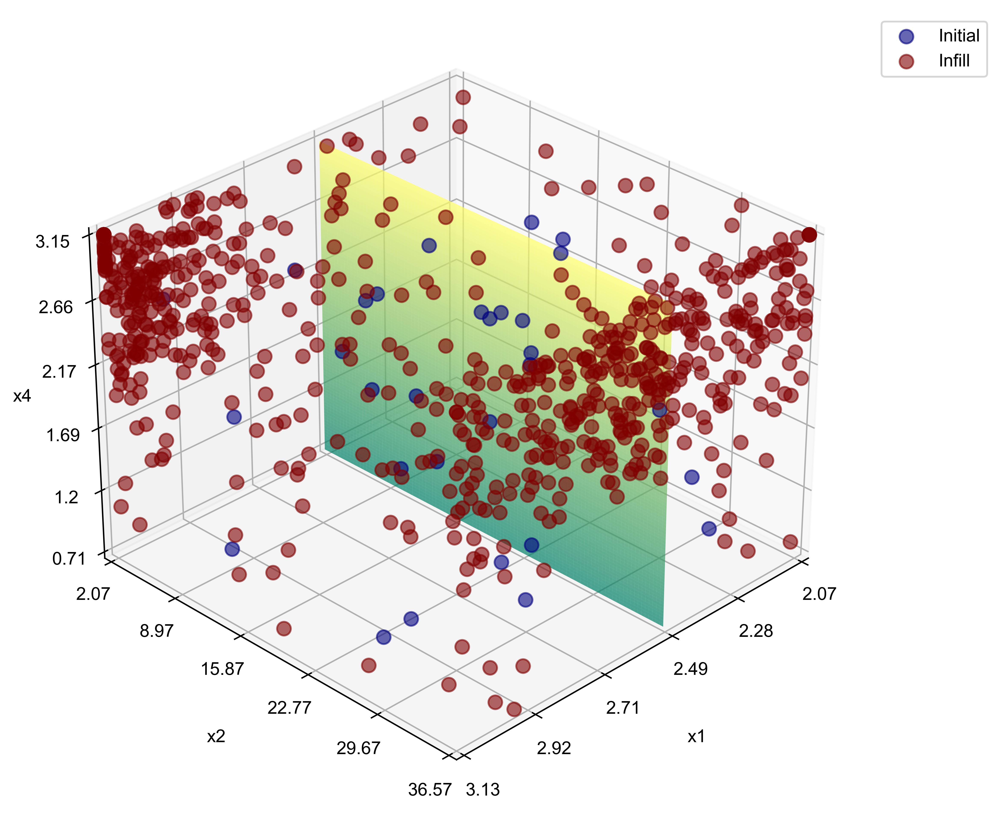

In [320]:
# Plots
# Check the sampling points
# Final lhc Sampling
x_indices = [0, 1, 3]  # three dimensional: x1, x2, and x4，这里选了三个维度，那么剩下的三个维度需要固定

print("LHC sampling points")
# 切割面可以在 x,y,z 轴，轴值对应的均值或者方差中寻找对应。
plotting.sampling_3d_exp(Exp_lhc, x_indices=x_indices, slice_axis="x", slice_value_real=2.5)

Objective function heatmap: 


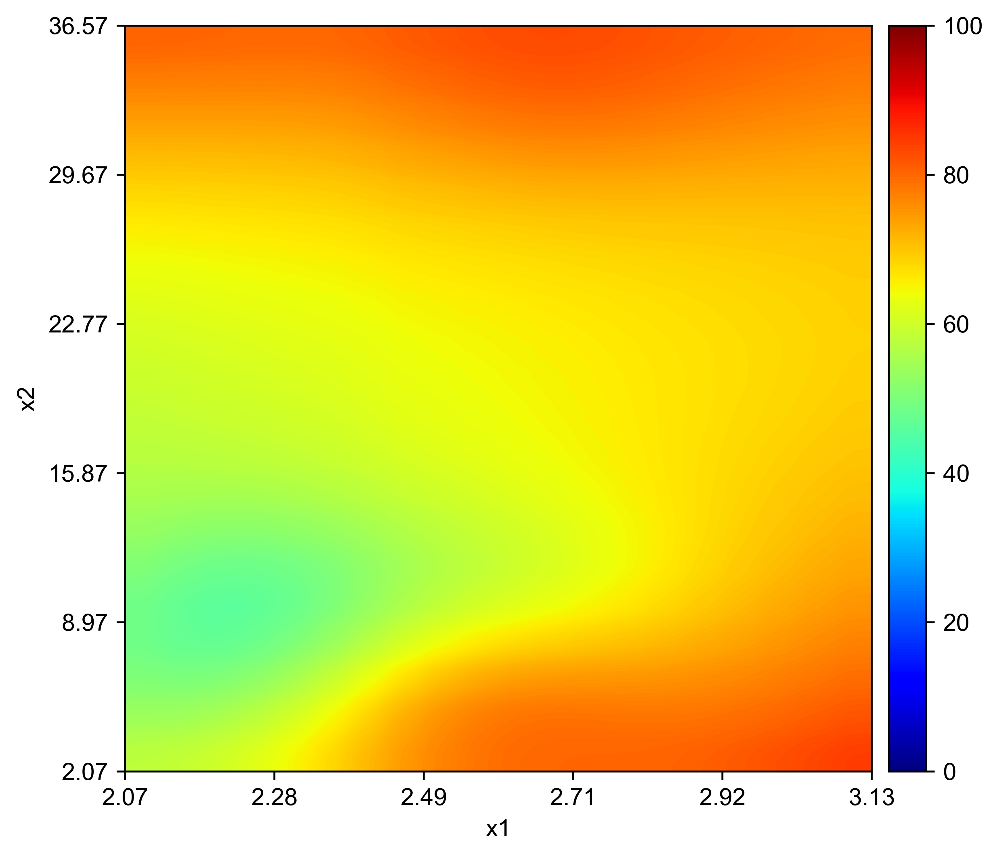

Evaluation of objective function 400 times takes 0.04 min



In [321]:
# Reponse heatmaps
# Set X_test mesh size
x_indices = [0, 1]  # 这里是 二维的重新选择两个维度
fixed_real = [-34, 2.5, 121, -33]

mesh_size = 20
n_test = mesh_size**2

# Objective function heatmap
# (this takes a long time)
print("Objective function heatmap: ")
start_time = time.time()

plotting.objective_heatmap(
    objective_func,
    X_ranges,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()

print(
    "Evaluation of objective function {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

Full factorial model heatmap: 


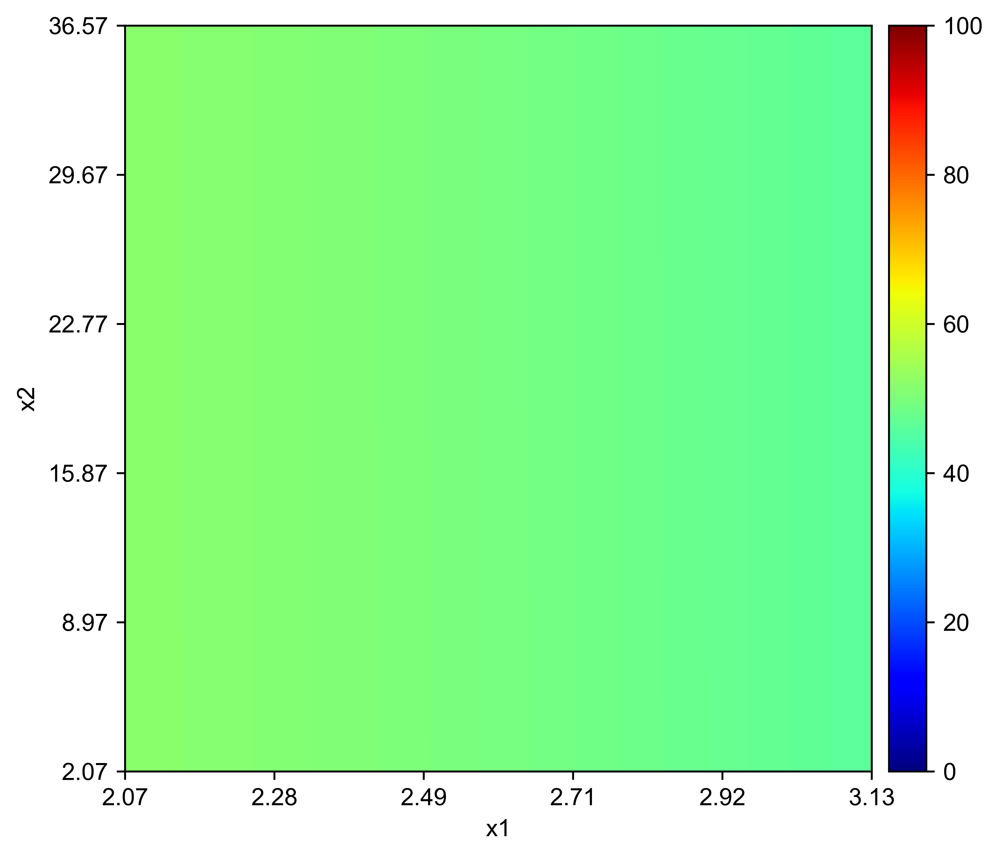

Evaluation of FF GP model 400 times takes 0.04 min

LHC model heatmap: 


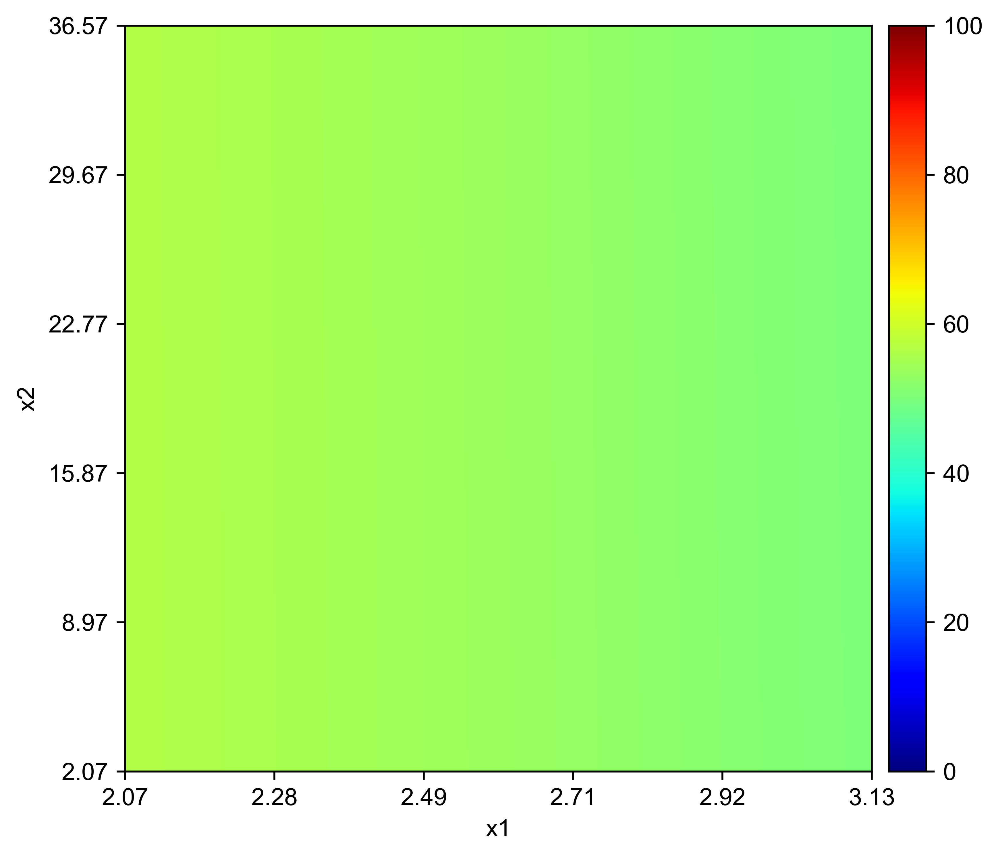

Evaluation of LHC GP model 400 times takes 0.04 min

RND model heatmap: 


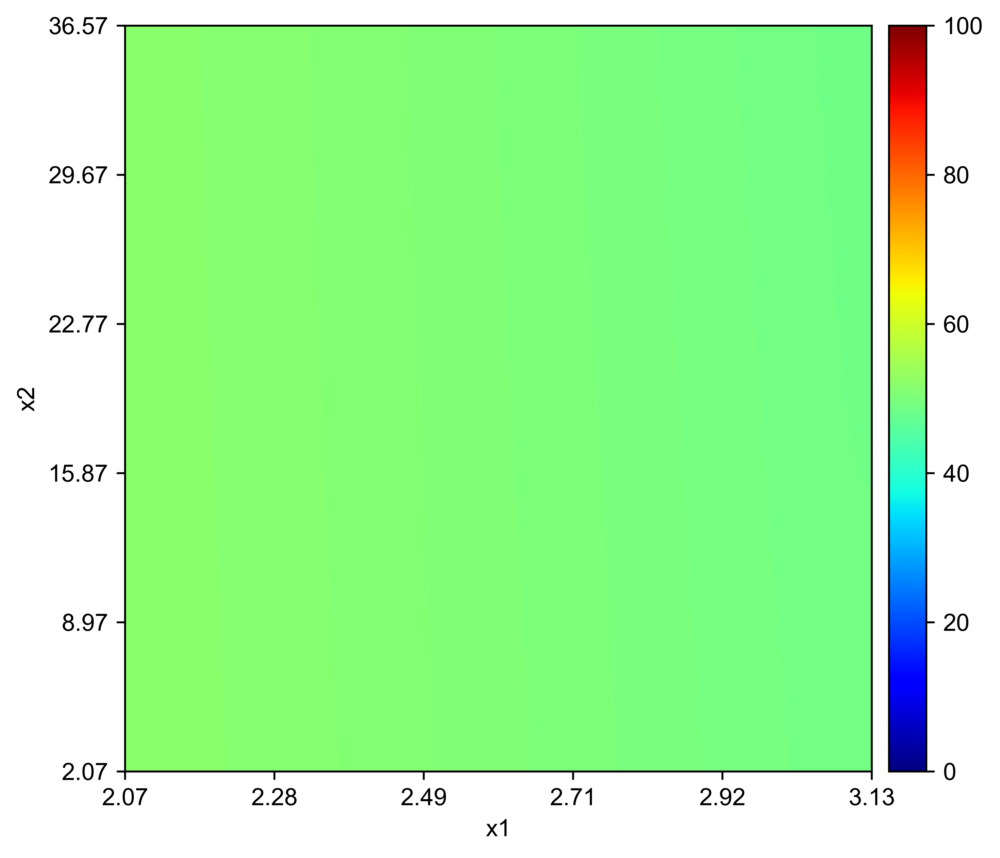

Evaluation of RND GP model 400 times takes 0.04 min



In [322]:
# full factorial heatmap
print("Full factorial model heatmap: ")
start_time = time.time()
plotting.response_heatmap_exp(
    Exp_ff,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of FF GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

# LHC heatmap
print("LHC model heatmap: ")
start_time = time.time()
plotting.response_heatmap_exp(
    Exp_lhc,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of LHC GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

# random sampling heatmap
print("RND model heatmap: ")
start_time = time.time()
plotting.response_heatmap_exp(
    Exp_rnd,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of RND GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

Objective function surface: 


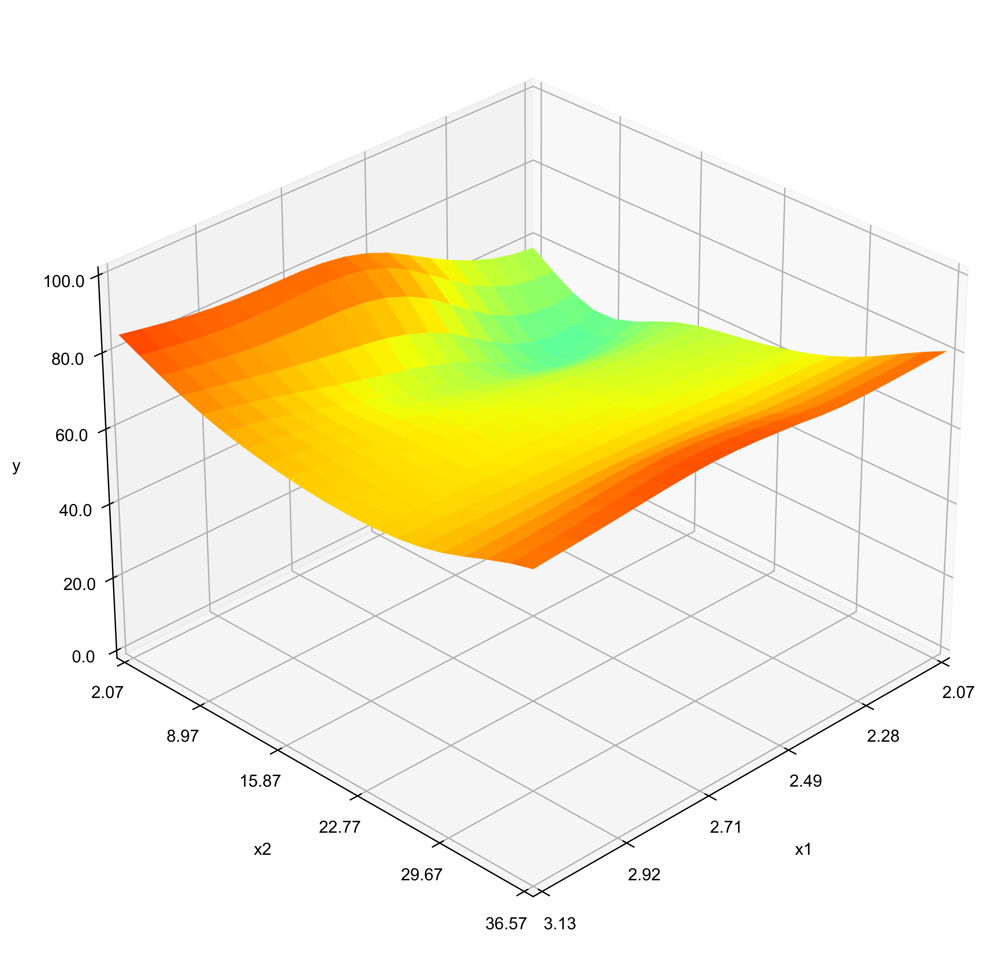

Evaluation of objective function 400 times takes 0.03 min

LHC model surface: 


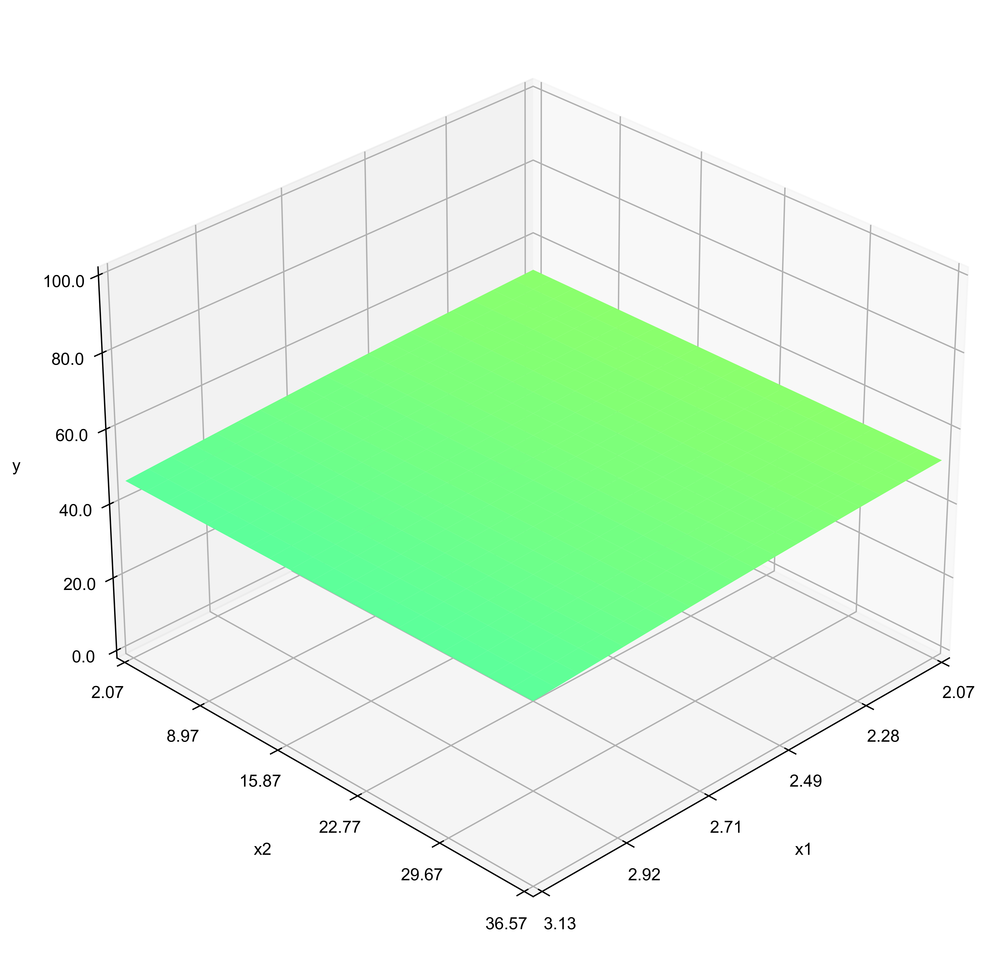

Evaluation of FF GP model 400 times takes 0.02 min

Full fatorial model surface: 


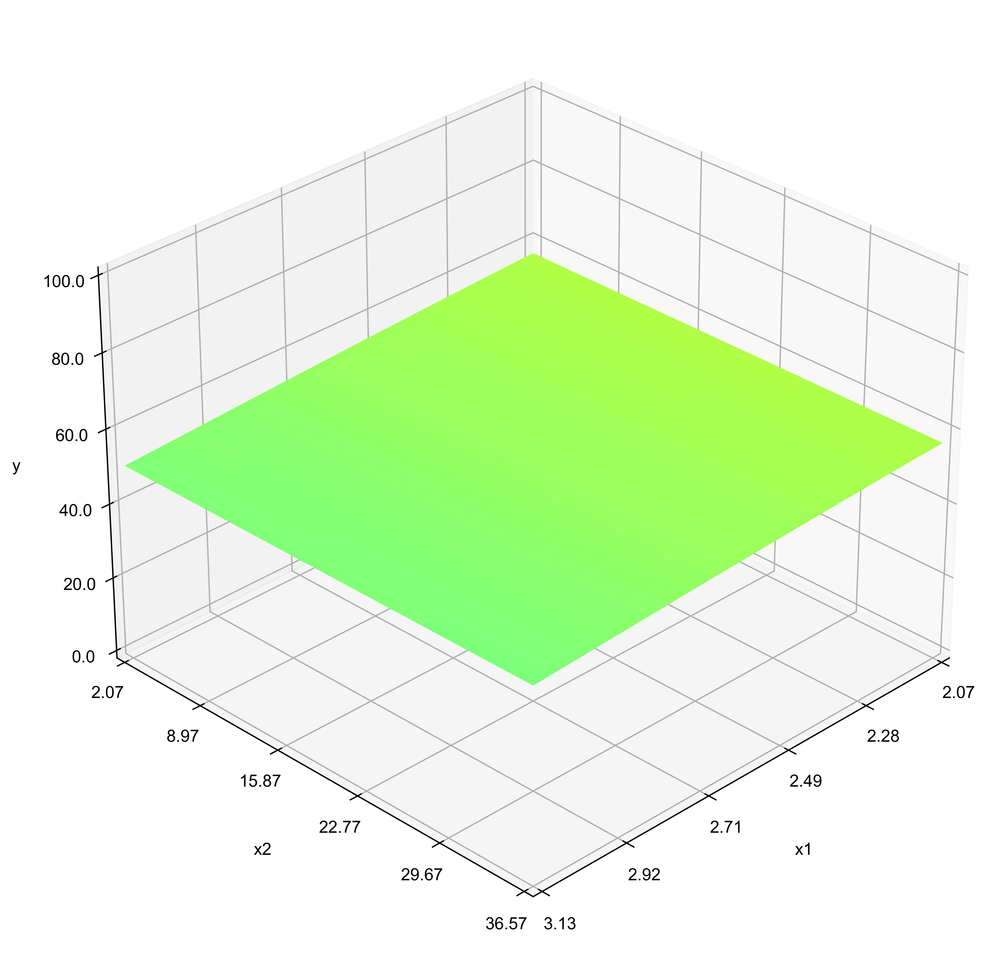

Evaluation of LHC GP model 400 times takes 0.02 min

RND model surface: 


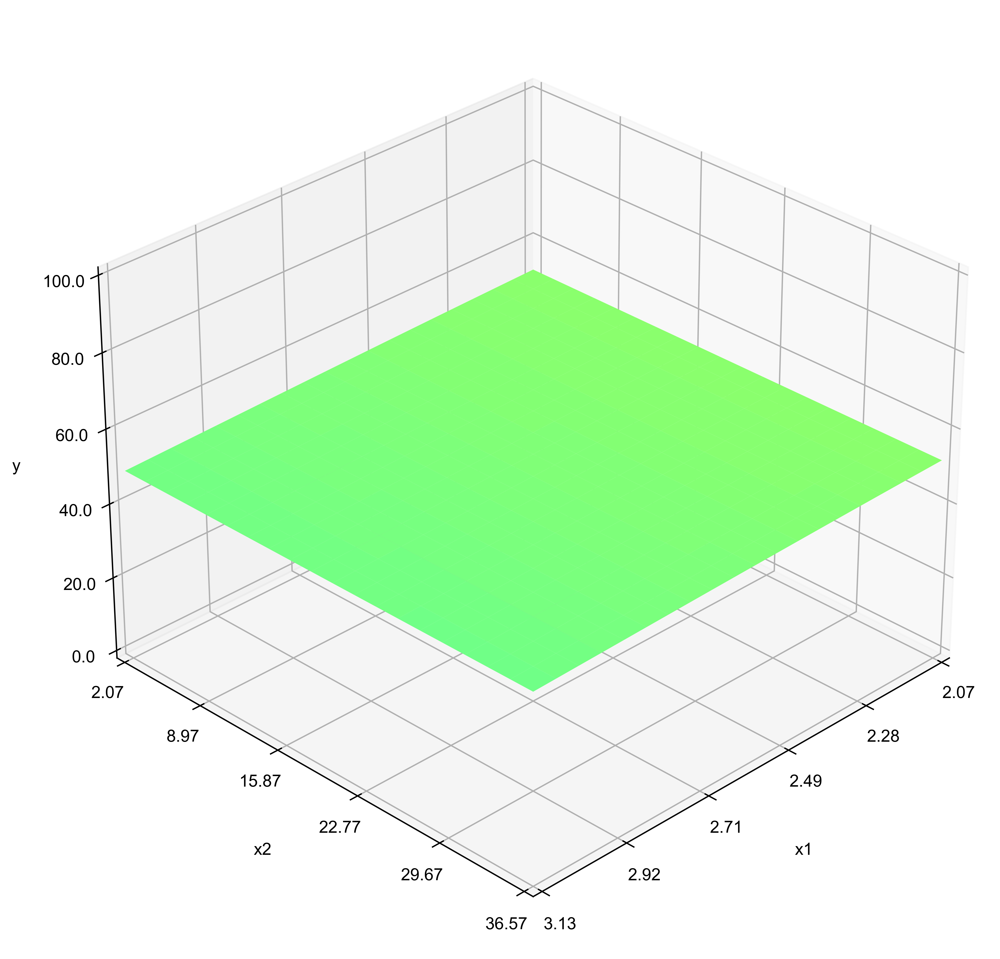

Evaluation of RND GP model 400 times takes 0.02 min



In [323]:
# Suface plots
# Objective function surface plot
# (this takes a long time)

print("Objective function surface: ")
start_time = time.time()
plotting.objective_surface(
    objective_func,
    X_ranges,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of objective function {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

# full fatorial surface plot
print("LHC model surface: ")
start_time = time.time()
plotting.response_surface_exp(
    Exp_ff,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of FF GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)


# LHC surface plot
print("Full fatorial model surface: ")
start_time = time.time()
plotting.response_surface_exp(
    Exp_lhc,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of LHC GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)


# random sampling surface plot
print("RND model surface: ")
start_time = time.time()
plotting.response_surface_exp(
    Exp_rnd,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of RND GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

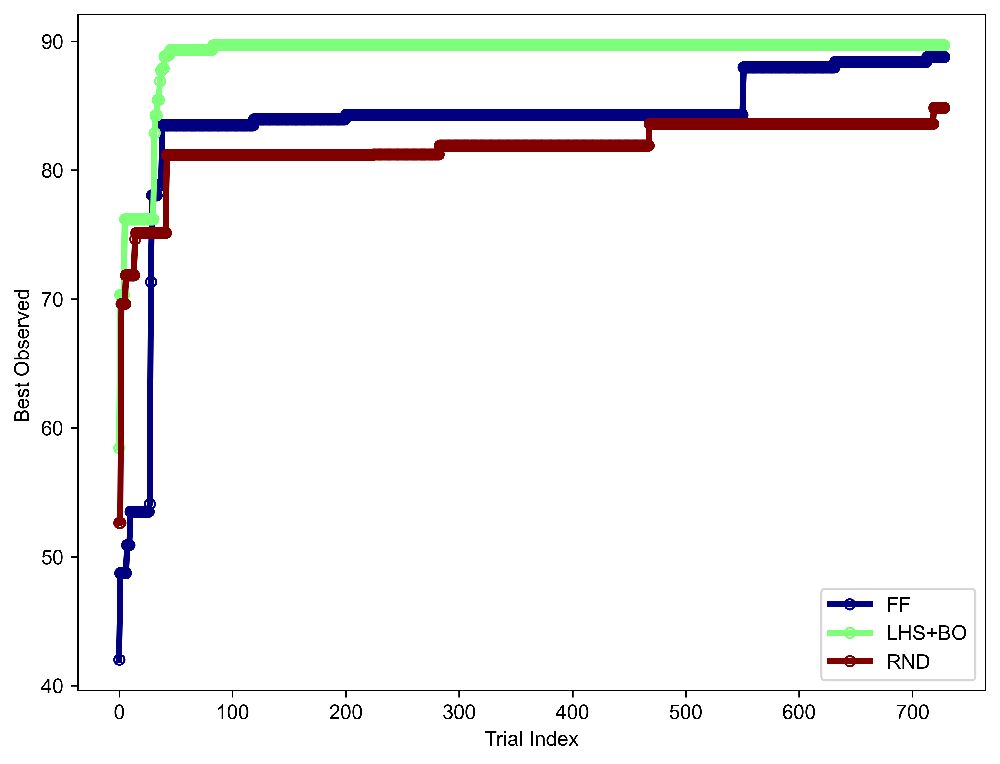

In [324]:
plotting.opt_per_trial(
    [Exp_ff.Y_real, Exp_lhc.Y_real, Exp_rnd.Y_real],
    design_names=["FF", "LHS+BO", "RND"],
)

Obtain the optimum from each method. 

In [325]:
# full factorial optimum
y_opt_ff, X_opt_ff, index_opt_ff = Exp_ff.get_optim()
data_opt_ff = io.np_to_dataframe([X_opt_ff, y_opt_ff], var_names)

print("From full factorial design, ")
display(data_opt_ff)

From full factorial design, 


,m_B,t_RT1,T_drawH,m_C,t_RT2,T_methyl,Yield
0,3.13,2.07,-33.15,3.15,278.6,-12.0,88.780212


In [326]:
# lhc optimum
y_opt_lhc, X_opt_lhc, index_opt_lhc = Exp_lhc.get_optim()
data_opt_lhc = io.np_to_dataframe([X_opt_lhc, y_opt_lhc], var_names)

print("From LHS + Bayesian Optimization, ")
display(data_opt_lhc)

From LHS + Bayesian Optimization, 


,m_B,t_RT1,T_drawH,m_C,t_RT2,T_methyl,Yield
0,3.13,2.07,-39.366352,3.15,278.600006,-12.0,89.705574


In [327]:
# random sampling optimum
y_opt_rnd, X_opt_rnd, index_opt_rnd = Exp_rnd.get_optim()
data_opt_rnd = io.np_to_dataframe([X_opt_rnd, y_opt_rnd], var_names)

print("From random sampling, ")
display(data_opt_rnd)

From random sampling, 


,m_B,t_RT1,T_drawH,m_C,t_RT2,T_methyl,Yield
0,3.088149,2.807937,-22.610409,3.001516,274.703446,-13.802883,84.841805
